# ___TRABAJO FINAL DE MÁSTER___
# ___Reto IBM___: Clasificación de imágenes de marcas
## Máster Universitario en Big Data Analytics - MBI
### Universidad Europea de Madrid
### ___Andrés Darío Gutiérrez Poveda___
#### Octubre 2021

# Descompresión de Datasets

In [ ]:
!unzip otros.zip

Archive:  otros.zip
   creating: 03_evaluation_data/
   creating: 03_evaluation_data/AMD/
  inflating: 03_evaluation_data/AMD/AMD (11).jpg  
  inflating: 03_evaluation_data/AMD/AMD (15).jpg  
  inflating: 03_evaluation_data/AMD/AMD (22).jpg  
  inflating: 03_evaluation_data/AMD/AMD (23).jpg  
  inflating: 03_evaluation_data/AMD/AMD (24).jpg  
  inflating: 03_evaluation_data/AMD/AMD (28).jpg  
  inflating: 03_evaluation_data/AMD/AMD (3).jpg  
  inflating: 03_evaluation_data/AMD/AMD (33).jpg  
  inflating: 03_evaluation_data/AMD/AMD (34).jpg  
  inflating: 03_evaluation_data/AMD/AMD (38).jpg  
  inflating: 03_evaluation_data/AMD/AMD (43).jpg  
  inflating: 03_evaluation_data/AMD/AMD (53).jpg  
  inflating: 03_evaluation_data/AMD/AMD (67).jpg  
  inflating: 03_evaluation_data/AMD/AMD (68).jpg  
  inflating: 03_evaluation_data/AMD/AMD (9).jpg  
   creating: 03_evaluation_data/Aquafina/
  inflating: 03_evaluation_data/Aquafina/Aquafina (27).jpg  
  inflating: 03_evaluation_data/Aquafina/Aqu

# Importación de librerias
Se importa todas las liberias a utilizar en el proyecto.


In [ ]:
# Liberias genéricas
import os, signal
import glob
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import pandas as pd
import random
import time
import shutil
import matplotlib.pyplot as plt

# SciPy
from scipy import interp

# SciKit-Learn
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.base import clone
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize

# API NumPy
import numpy as np
from numpy import expand_dims

# API Tensorflow
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import resnet50
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import Adam
tf.get_logger().setLevel('ERROR')
tf.keras.backend.clear_session() # Para reiniciar la sesión del notebook.

# API Keras
import keras
from keras.models import Model
from keras.layers import Dense, ReLU, GlobalAveragePooling2D, Dropout, GlobalMaxPooling2D, BatchNormalization, Conv2D, Flatten
from keras.applications import mobilenet
from keras.applications.mobilenet import preprocess_input as preprocess_mobilenet
from keras.preprocessing.image import ImageDataGenerator

# Definición de funciones

## Funciones propias

In [ ]:
# Función para predecir la imagen dando la ruta del archivo y el modelo
def predict_image(path,model,imageGen,retornar):
    class_dict = {v:k for k, v in imageGen.class_indices.items()} # Se define el directorio para saber las categorias dentro del modelo
    img = image.load_img(path) # Se carga la imagen.
    img = img.resize((256, 256)) # Tamaño de la imagen.
    data = expand_dims(image.img_to_array(img), 0) # Se añade un 4Tensor.
    data = preprocess_mobilenet(data) # Se realiza el preprocesado para MobileNet.
    preds = model.predict(data)[0] # Predicción del modelo recibido por parámetro.
    pred_idx = np.argmax(preds) # Obtención del indice de la predicción de la imagen.
    pred_label = class_dict[pred_idx] # Categoria predecida.
    pred_conf = round(preds[pred_idx], 2) # Confiabilidad de la predicción.
    if retornar:
        return pred_label, pred_conf, img # Se retorna la clasificación predecida, la confiabiliadad de la misma y la imagen dentro del path recibido.
    else:
        return pred_label, pred_conf # Se retorna la clasificación predecida y la confiabiliadad de la misma de la imagen dentro del path recibido.

In [ ]:
# Función para evaluar un modelo, mostrando dos ejemplos de cada categoría.
def evaluate_model(path,model,imageGen):
    true_labels = np.array([]) # Listado de categorías originales de las imágenes.
    pred_labels = np.array([]) # Listado de categorías predecidas de las imágenes.

    grid_width = 8 # Ancho de la grilla para la gráfica de imágenes.
    grid_height = 6 # Alto de la grilla para la gráfica de imágenes.
    f, ax = plt.subplots(grid_height, grid_width) # Gráfica para las imágenes.
    f.set_size_inches(20, 15) # Tamaño de la gráfica de imágenes.
    i = 0
    j = 0

    #Se definine un contador de tiempo para validar cuando tarda en evaluar el modelo.
    tic = time.perf_counter()

    # Se recorre la carpeta con la imágenes.
    for (dirpath, dirnames, filenames) in os.walk(path):
        cat_cont = 0
        # Se recorren todas las imágenes dentro de la carpeta para evaluar el modelo con cada una.
        for filename in filenames:
            if filename.endswith('.jpg'): 
                new_path = os.sep.join([dirpath, filename])
                actual_label = dirpath.split('/')[1].strip() # Se obtiene la clasificación correcta.
                pred_label, pred_conf, img = predict_image(new_path,model,imageGen,1) # Se predice la categoría de la imagen.
                true_labels = np.append(true_labels,actual_label) # Se enlista la clasificación original.
                pred_labels = np.append(pred_labels,pred_label) # Se enlista la clasificación predecida.
                # Algoritmo para posicionar la imágen en la grilla de la gráfica.
                if cat_cont < 2:
                    ax[i][j].axis('off')
                    ax[i][j].set_title('Actual: '+ actual_label + '\nPred: ' + pred_label + '\nConf: ' + str(pred_conf))
                    ax[i][j].imshow(img)                  
                    if i <= grid_height-1:                    
                        if j < grid_width-1:
                            j += 1
                        else:
                            i += 1
                            j = 0
                cat_cont += 1
    
    # Se imprime la gráfica            
    plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0.5, hspace=0.55)   
    
    # Se define el contador una vez termina de evaluar el modelo
    toc = time.perf_counter()
    
    # Se imprime lo que tardo la evaluación
    print(f"\nEvaluar el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

    return true_labels, pred_labels

In [ ]:
# Función que grafica el comportamiento de las métricas Accuracy, Loss y MSE
def gen_graphs_metrics(nombre,history,epochs):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
    t = f.suptitle('Modelo: ' + nombre, fontsize=12)
    f.subplots_adjust(top=0.85, wspace=0.3)

    epoch_list = list(range(1,epochs+1))
    ax1.plot(epoch_list, history.history['accuracy'], label='Train Accuracy')
    ax1.plot(epoch_list, history.history['val_accuracy'], label='Validation Accuracy')
    ax1.set_xticks(np.arange(0, epochs+1, 1))
    ax1.set_ylabel('Accuracy Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('Accuracy')
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, history.history['loss'], label='Train Loss')
    ax2.plot(epoch_list, history.history['val_loss'], label='Validation Loss')
    ax2.set_xticks(np.arange(0, epochs+1, 1))
    ax2.set_ylabel('Loss Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('Loss')
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, history.history['mse'], label='Train MSE')
    ax3.plot(epoch_list, history.history['val_mse'], label='Validation MSE')
    ax3.set_xticks(np.arange(0, epochs+1, 1))
    ax3.set_ylabel('MSE Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('MSE')
    l3 = ax3.legend(loc="best")

## Funciones externas
Funciones para presentar y gráficar las métricas de los resultados. Se utilizan las funciones creadas por Dipanjan Sarkar.

In [ ]:
"""
Created on Mon Jul 31 20:05:23 2017
@author: DIP
@Copyright: Dipanjan Sarkar
"""

def get_metrics(true_labels, predicted_labels):
    print('Accuracy:', np.round(metrics.accuracy_score(true_labels, predicted_labels), 4))
    print('Precision:', np.round(metrics.precision_score(true_labels, predicted_labels, average='weighted'), 4))
    print('Recall:', np.round(metrics.recall_score(true_labels, predicted_labels, average='weighted'), 4))
    print('F1 Score:', np.round(metrics.f1_score(true_labels, predicted_labels, average='weighted'), 4))
                        

def train_predict_model(classifier, train_features, train_labels, test_features, test_labels):
    # build model    
    classifier.fit(train_features, train_labels)
    # predict using model
    predictions = classifier.predict(test_features) 
    return predictions    


def display_confusion_matrix(true_labels, predicted_labels, classes=[1,0]):
    total_classes = len(classes)
    level_labels = [total_classes*[0], list(range(total_classes))]
    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels, labels=classes)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], classes], codes=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], classes], codes=level_labels)) 
    print(cm_frame) 
    
    
def display_classification_report(true_labels, predicted_labels, classes=[1,0]):
    report = metrics.classification_report(y_true=true_labels, 
                                           y_pred=predicted_labels, 
                                           labels=classes) 
    print(report)
    
    
def display_model_performance_metrics(true_labels, predicted_labels, classes=[1,0]):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, 
                                  classes=classes)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, 
                             classes=classes)


def plot_model_decision_surface(clf, train_features, train_labels,
                                plot_step=0.02, cmap=plt.cm.RdYlBu,
                                markers=None, alphas=None, colors=None):
    if train_features.shape[1] != 2:
        raise ValueError("X_train should have exactly 2 columnns!")
    
    x_min, x_max = train_features[:, 0].min() - plot_step, train_features[:, 0].max() + plot_step
    y_min, y_max = train_features[:, 1].min() - plot_step, train_features[:, 1].max() + plot_step
    xx, yy = np.meshgrid(np.arange(x_min, x_max, plot_step),
                         np.arange(y_min, y_max, plot_step))

    clf_est = clone(clf)
    clf_est.fit(train_features,train_labels)
    if hasattr(clf_est, 'predict_proba'):
        Z = clf_est.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1]
    else:
        Z = clf_est.predict(np.c_[xx.ravel(), yy.ravel()])    
    Z = Z.reshape(xx.shape)
    cs = plt.contourf(xx, yy, Z, cmap=cmap)
    
    le = LabelEncoder()
    y_enc = le.fit_transform(train_labels)
    n_classes = len(le.classes_)
    plot_colors = ''.join(colors) if colors else [None] * n_classes
    label_names = le.classes_
    markers = markers if markers else [None] * n_classes
    alphas = alphas if alphas else [None] * n_classes
    for i, color in zip(range(n_classes), plot_colors):
        idx = np.where(y_enc == i)
        plt.scatter(train_features[idx, 0], train_features[idx, 1], c=color,
                    label=label_names[i], cmap=cmap, edgecolors='black', 
                    marker=markers[i], alpha=alphas[i])
    plt.legend()
    plt.show()


def plot_model_roc_curve(clf, features, true_labels, label_encoder=None, class_names=None):
    ## Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    if hasattr(clf, 'classes_'):
        class_labels = clf.classes_
    elif label_encoder:
        class_labels = label_encoder.classes_
    elif class_names:
        class_labels = class_names
    else:
        raise ValueError('Unable to derive prediction classes, please specify class_names!')
    n_classes = len(class_labels)
    y_test = label_binarize(true_labels, classes=class_labels)
    if n_classes == 2:
        if hasattr(clf, 'predict_proba'):
            prob = clf.predict_proba(features)
            y_score = prob[:, prob.shape[1]-1] 
        elif hasattr(clf, 'decision_function'):
            prob = clf.decision_function(features)
            y_score = prob[:, prob.shape[1]-1]
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
        
        fpr, tpr, _ = roc_curve(y_test, y_score)      
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label='ROC curve (area = {0:0.2f})'
                                 ''.format(roc_auc),
                 linewidth=2.5)
        
    elif n_classes > 2:
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(features)
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")

        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        ## Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        ## Compute macro-average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        # Finally average it and compute AUC
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        ## Plot ROC curves
        plt.figure(figsize=(6, 4))
        plt.plot(fpr["micro"], tpr["micro"],
                 label='micro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["micro"]), linewidth=3)

        plt.plot(fpr["macro"], tpr["macro"],
                 label='macro-average ROC curve (area = {0:0.2f})'
                       ''.format(roc_auc["macro"]), linewidth=3)

        for i, label in enumerate(class_labels):
            plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'
                                           ''.format(label, roc_auc[i]), 
                     linewidth=2, linestyle=':')
    else:
        raise ValueError('Number of classes should be atleast 2 or more')
        
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

# Tratamiento del dataset

## Carga del dataset

Se va a utilizar la transferencia de conocimiento para la clasificación de un dataset de imágenes de marcas que consta de 23 categorías entregadas en dos dataset:

___Dataset Público___
1. AMD
2. Aquafina
3. Disney
4. D-Link
5. Domino's Pizza
6. Hellmann's
7. IBM
8. Kitkat
9. LG
10. Lipton
11. McDonalds
12. Milka
13. Monster
14. Nestea
15. Pac-Man
16. Pepsi
17. Pizza Hut
18. Red Bull
19. Samsung
20. Sony
21. Tic Tac
22. Universal

___Dataset Individual___
23. Heineken

A continuación se carga el dataset y se comprueba que contiene información para poder cumplir con el objetivo del reto:

In [ ]:
# Se define el directorio donde se encuentran las imagenes con las que se ejecuta el modelo
dirPath = "datasets/"

# Se valida que el directorio exista:
if (os.path.isdir(dirPath)):
    # Se define la lista de categorias que contiene el diectorio
    categoriasDir = os.listdir(dirPath)
    for categoria in categoriasDir:
        print("Categoría: '" + categoria + "' contiene '" + str(len([item for item in os.listdir(dirPath + categoria) 
             if os.path.isfile(os.path.join(dirPath + categoria, item))]))+ "' imagenes.")
else:
    print("No existe el directorio en la ruta especificada...")

Categoría: 'sony' contiene '70' imagenes.
Categoría: 'Milka' contiene '70' imagenes.
Categoría: 'Pizza Hut' contiene '70' imagenes.
Categoría: 'samsung' contiene '70' imagenes.
Categoría: 'Monster' contiene '70' imagenes.
Categoría: 'Lipton' contiene '70' imagenes.
Categoría: 'Tic Tac' contiene '70' imagenes.
Categoría: 'Hellmann's' contiene '70' imagenes.
Categoría: 'Domino's Pizza' contiene '70' imagenes.
Categoría: 'Universal' contiene '70' imagenes.
Categoría: 'AMD' contiene '70' imagenes.
Categoría: 'Aquafina' contiene '70' imagenes.
Categoría: 'PacMan' contiene '70' imagenes.
Categoría: 'Nestea' contiene '70' imagenes.
Categoría: 'D-link' contiene '70' imagenes.
Categoría: 'Red Bull' contiene '70' imagenes.
Categoría: 'Disney' contiene '70' imagenes.
Categoría: 'Kitkat' contiene '70' imagenes.
Categoría: 'LG' contiene '70' imagenes.
Categoría: 'Heineken' contiene '70' imagenes.
Categoría: 'Pepsi' contiene '70' imagenes.
Categoría: 'McDonalds' contiene '70' imagenes.
Categoría: 'I

Se encuentra que las diferentes categorías se encuentran balanceadas, cada uno tiene 70 imágenes, por lo que la clasificación no va a estar inclinada hacia alguna categoría en especial.

In [ ]:
# Se genera un número aletorio teniendo en cuenta el total de número de imagenes
numAleatorio = random.randint(1, 70)
aleatorio = str(numAleatorio)

# Se hace una carga de una imagen mediante 'load_img' para verificar que se vizualizan desde su categoría
for categoria in categoriasDir:    
    image.load_img(dirPath + categoria + '/' + categoria + ' (' + aleatorio + ').jpg')

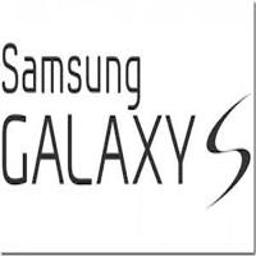

In [ ]:
# Se hace una carga de una imagen mediante 'load_img' para verificar que se vizualizan desde su categoría
image.load_img(dirPath + categoriasDir[3] + '/' + categoriasDir[3] + ' (' + aleatorio + ').jpg')

## Definición de dataset para Train, Validation y Evaluation

A continuación creamos nuestro <font color=blue>ImageDataGenerator</font> para los datos del directorio de __marcas__:

El *'ImageDataGenerator'* hace ciertas transformaciones definiendole sus parámetros, tales como, una función de preprocesado, que es especial para cada una de las redes, tamaño predeterminado, o rgb por vgr, ect.. 

El *'ImageDataGenerator'* se está creando con un __57%__ para datos de __Training__, __21,5%__ para nuestros datos de __Validation__ y __21,5%__ para nuestros datos de __Evaluation__.

In [ ]:
train_set = np.array([])
validation_set = np.array([])
evaluation_set = np.array([])

for categoria in categoriasDir:
    cat_files = glob.glob(dirPath + categoria + '/*')
    train_cat = np.random.choice(cat_files, size=40, replace=False)
    cat_files = list(set(cat_files) - set(train_cat))
    validation_cat = np.random.choice(cat_files, size=15, replace=False)
    cat_files = list(set(cat_files) - set(validation_cat))
    evaluation_cat = np.random.choice(cat_files, size=15, replace=False)
    train_set = np.append(train_set, train_cat)
    validation_set = np.append(validation_set, validation_cat)
    evaluation_set = np.append(evaluation_set, evaluation_cat)

print('Datasets:', train_set.shape, validation_set.shape, evaluation_set.shape)

Datasets: (920,) (345,) (345,)


In [ ]:
train_dir = '01_training_data/'
valid_dir = '02_validation_data/'
evalu_dir = '03_evaluation_data/'
evaluation_labels = np.array([])

os.mkdir(train_dir) if not os.path.isdir(train_dir) else None
os.mkdir(valid_dir) if not os.path.isdir(valid_dir) else None
os.mkdir(evalu_dir) if not os.path.isdir(evalu_dir) else None

for fn in train_set:
    clase = fn.split('/')[1].split('(')[0].strip()
    os.mkdir(train_dir + clase) if not os.path.isdir(train_dir + clase) else None
    shutil.copy(fn, train_dir + clase + "/")

for fn in validation_set:
    clase = fn.split('/')[1].split('(')[0].strip()
    os.mkdir(valid_dir + clase) if not os.path.isdir(valid_dir + clase) else None
    shutil.copy(fn, valid_dir + clase + "/")
    
for fn in evaluation_set:
    clase = fn.split('/')[1].split('(')[0].strip()
    evaluation_labels = np.append(evaluation_labels,clase)
    os.mkdir(evalu_dir + clase) if not os.path.isdir(evalu_dir + clase) else None
    shutil.copy(fn, evalu_dir + clase + "/")

In [ ]:
train_dir = '01_training_data/'
valid_dir = '02_validation_data/'
evalu_dir = '03_evaluation_data/'
BATCH_SIZE = 32

# Se define ImageDataGenerator
image_datagenMN = ImageDataGenerator(preprocessing_function = preprocess_mobilenet)

# Se define el train_generator tomando los datos desde un directorio (flow_from_directory)
# y con sus respectivos parametros, tamaño, tipo de color, ect...
train_generatorMN = image_datagenMN.flow_from_directory(train_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE, 
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training")

#Se define el validation_generator.
validation_generatorMN = image_datagenMN.flow_from_directory(valid_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training")

# Se define el evaluation_generator.
evaluation_generatorMN = image_datagenMN.flow_from_directory(evalu_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training")

Found 920 images belonging to 23 classes.
Found 345 images belonging to 23 classes.
Found 345 images belonging to 23 classes.


In [ ]:
print("Lo anterior quiere decir que vamos a entrenar nuestro modelo con: \n"
      + "Datos: " + str(train_generatorMN.subset) 
      + "\nImagenes: " + str(len(train_generatorMN.filepaths)) 
      + "\nClases: " + str(train_generatorMN.num_classes))

print("\nDatos: " + str(validation_generatorMN.subset) 
      + "\nImagenes: " + str(len(validation_generatorMN.filepaths)) 
      + "\nClases: " + str(validation_generatorMN.num_classes))

print("\nDatos: " + str(evaluation_generatorMN.subset) 
      + "\nImagenes: " + str(len(evaluation_generatorMN.filepaths)) 
      + "\nClases: " + str(evaluation_generatorMN.num_classes))

Lo anterior quiere decir que vamos a entrenar nuestro modelo con: 
Datos: training
Imagenes: 920
Clases: 23

Datos: training
Imagenes: 345
Clases: 23

Datos: training
Imagenes: 345
Clases: 23


# Modelos de clasificación de imágenes

El esquema de modelos de clasificación de imágenes tiene capas convolucionales seguidas de capas completamente conectadas. Las capas de convolución extraen las características (*features*) de la imagen  y las capas completamente conectadas (*fully conected*) realizan la clasificación la imagen usando estás características extraídas.

Cuando se entrena una CNN con un dataset de imágenes, se ve que las capas superiores de la red aprenden a extraer características generales de imágenes como bordes, distribución de colores, etc. A medida que se avanza en la red, las capas tienden a extraer más características específicas y de está manera va realizando el aprendizaje.

Ahora se puede usar estos modelos previamente entrenados que ya saben cómo extraer las características y evitar el entrenamiento desde cero. Este concepto se conoce como “Transfer Learning”. Lo anterior quiere decir, que se puede aprovechar al máximo el conocimiento de modelos potentes con el fin de extraer sus características. 
Por ejemplo, si se quiere clasificar una imagen se puede emplear un modelo preentrenado con ‘imagenet’, que cuenta con una gran colección de datos de imágenes (contiene 1000 categorías) y así  clasificar cualquier imagen que se encuentre dentro de las mismas.

En consecuencia, se a aprovechará las diferentes arquitecturas de redes CNN, para extraer sus características y reentrenar los modelos. Definiendo capas propias, clasificadores propios, números de iteraciones propios, etc., con el fin de evaluar estos modelos construidos para la clasificación en las 23 categorías listadas anteriormente.

# Construcción y entrenamiento de modelos

## Modelo Original: __MobileNet__

### Construcción del modelo:

Se va a constuir un modelo preentrenado con la red  *__MobileNet__*.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_O = mobilenet.MobileNet(weights = 'imagenet', include_top = True) 
w_O = base_modelMN_O.output
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_O = Dense(23, activation = 'softmax')(w_O)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_O = Model(inputs = base_modelMN_O.input, outputs = predsW_O)
# Se imprime el resumen del modelo
modelMN_O.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv1 (Conv2D)               (None, 112, 112, 32)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 112, 112, 32)      128       
_________________________________________________________________
conv1_relu (ReLU)            (None, 112, 112, 32)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)      288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, 112, 112, 32)      128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, 112, 112, 32)      0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_O.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_O.layers)))

Las capas que tiene mi 'modelo base' son: 92

Las capas que tiene mi 'modelo' son: 93


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_O.layers[:92]:
    layer.trainable = False
for layer in modelMN_O.layers[92:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se complila el modelo
modelMN_O.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo
num_epochs = 12
history_O = modelMN_O.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/12
28/28 [==============================] - 49s 2s/step - loss: 3.1381 - accuracy: 0.0462 - mse: 0.0416 - val_loss: 3.1363 - val_accuracy: 0.0464 - val_mse: 0.0416
Epoch 2/12
28/28 [==============================] - 47s 2s/step - loss: 3.1376 - accuracy: 0.0439 - mse: 0.0416 - val_loss: 3.1359 - val_accuracy: 0.0435 - val_mse: 0.0416
Epoch 3/12
28/28 [==============================] - 47s 2s/step - loss: 3.1371 - accuracy: 0.0439 - mse: 0.0416 - val_loss: 3.1356 - val_accuracy: 0.0493 - val_mse: 0.0416
Epoch 4/12
28/28 [==============================] - 47s 2s/step - loss: 3.1369 - accuracy: 0.0518 - mse: 0.0416 - val_loss: 3.1352 - val_accuracy: 0.0522 - val_mse: 0.0416
Epoch 5/12
28/28 [==============================] - 47s 2s/step - loss: 3.1363 - accuracy: 0.0541 - mse: 0.0416 - val_loss: 3.1348 - val_accuracy: 0.0522 - val_mse: 0.0416
Epoch 6/12
28/28 [==============================] - 48s 2s/step - loss: 3.1360 - accuracy: 0.0529 - mse: 0.0416 - val_loss: 3.1344 - val_acc

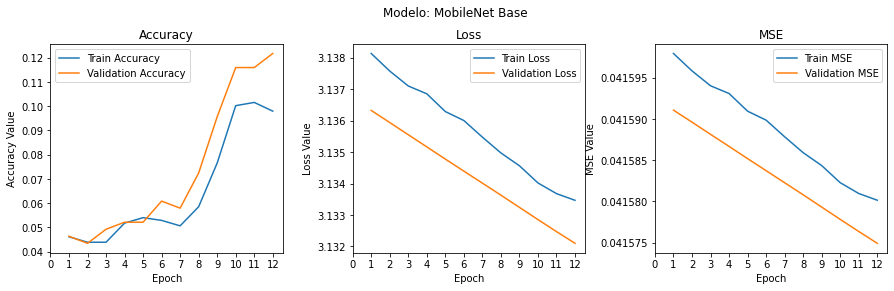

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet Base',history_O,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4819 minutos


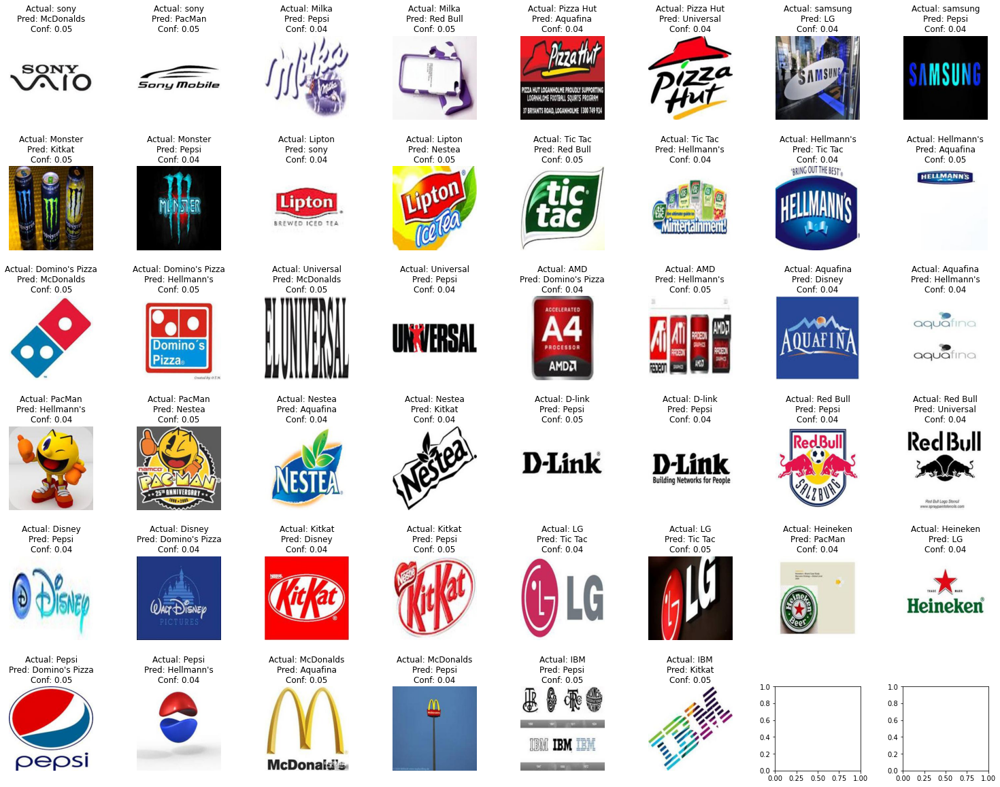

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_O = np.array([])
pred_labels_O = np.array([])
true_labels_O, pred_labels_O = evaluate_model(path,modelMN_O,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_O, 
                                  predicted_labels=pred_labels_O, 
                                  classes=list(set(true_labels_O)))

Model Performance metrics:
------------------------------
Accuracy: 0.0464
Precision: 0.0543
Recall: 0.0464
F1 Score: 0.0433

Model Classification report:
------------------------------
                precision    recall  f1-score   support

      Aquafina       0.10      0.13      0.11        15
      Red Bull       0.00      0.00      0.00        15
        Nestea       0.10      0.20      0.14        15
         Pepsi       0.02      0.07      0.03        15
           IBM       0.00      0.00      0.00        15
       Tic Tac       0.00      0.00      0.00        15
     Pizza Hut       0.00      0.00      0.00        15
           AMD       0.00      0.00      0.00        15
     McDonalds       0.10      0.13      0.11        15
        Kitkat       0.00      0.00      0.00        15
        Lipton       0.50      0.13      0.21        15
        PacMan       0.03      0.07      0.04        15
         Milka       0.00      0.00      0.00        15
Domino's Pizza       0.04    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet Original__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __4,64%__ y un __*F-Score*__ del __4,33%__. Las clase que mejor de predijeron fueron Lipton con el un __*F-Score*__ de __21%__; Disney con __17%__. Mientras que muchas categorías quedaron con __0%__.

In [ ]:
# Se guarda el modelo
modelMN_O.save('MobileNet_O.h5')

## Modelo Base: __MobileNet__


### Construcción del modelo:

Se va a constuir un modelo preentrenado con la red  *__MobileNet__*.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w = base_modelMN.output
# Se agrega una capa AveragePooling
w = GlobalAveragePooling2D()(w)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w = Dense(1024, activation = 'relu')(w) 
# Se agrega una capa densa con 1024 nodos y activado con RELU
w = Dense(1024, activation = 'relu')(w)
# Se agrega una capa densa con 512 nodos y activado con RELU
w = Dense(512, activation = 'relu')(w)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW = Dense(23, activation = 'softmax')(w)

17235968/17225924 [==============================] - 0s 0us/step


In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN = Model(inputs = base_modelMN.input, outputs = predsW)
# Se imprime el resumen del modelo
modelMN.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0     

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN.layers[:87]:
    layer.trainable = False
for layer in modelMN.layers[87:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se complila el modelo
modelMN.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo
num_epochs = 12
history_base = modelMN.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

#Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

#Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/12
28/28 [==============================] - 53s 2s/step - loss: 2.9465 - accuracy: 0.2038 - mse: 0.0405 - val_loss: 2.6409 - val_accuracy: 0.4406 - val_mse: 0.0386
Epoch 2/12
28/28 [==============================] - 50s 2s/step - loss: 2.3382 - accuracy: 0.5090 - mse: 0.0356 - val_loss: 2.2161 - val_accuracy: 0.4899 - val_mse: 0.0342
Epoch 3/12
28/28 [==============================] - 50s 2s/step - loss: 1.8296 - accuracy: 0.6430 - mse: 0.0296 - val_loss: 1.8070 - val_accuracy: 0.6319 - val_mse: 0.0287
Epoch 4/12
28/28 [==============================] - 50s 2s/step - loss: 1.4111 - accuracy: 0.7432 - mse: 0.0236 - val_loss: 1.5354 - val_accuracy: 0.6638 - val_mse: 0.0248
Epoch 5/12
28/28 [==============================] - 50s 2s/step - loss: 1.0977 - accuracy: 0.8164 - mse: 0.0186 - val_loss: 1.2803 - val_accuracy: 0.7246 - val_mse: 0.0207
Epoch 6/12
28/28 [==============================] - 50s 2s/step - loss: 0.8936 - accuracy: 0.8333 - mse: 0.0153 - val_loss: 1.1588 - val_acc

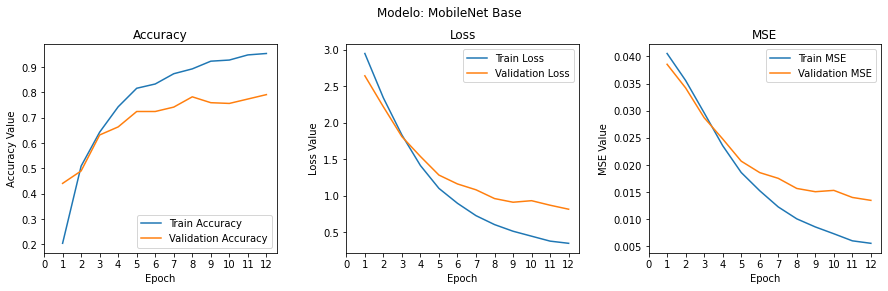

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet Base',history_base,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4882 minutos


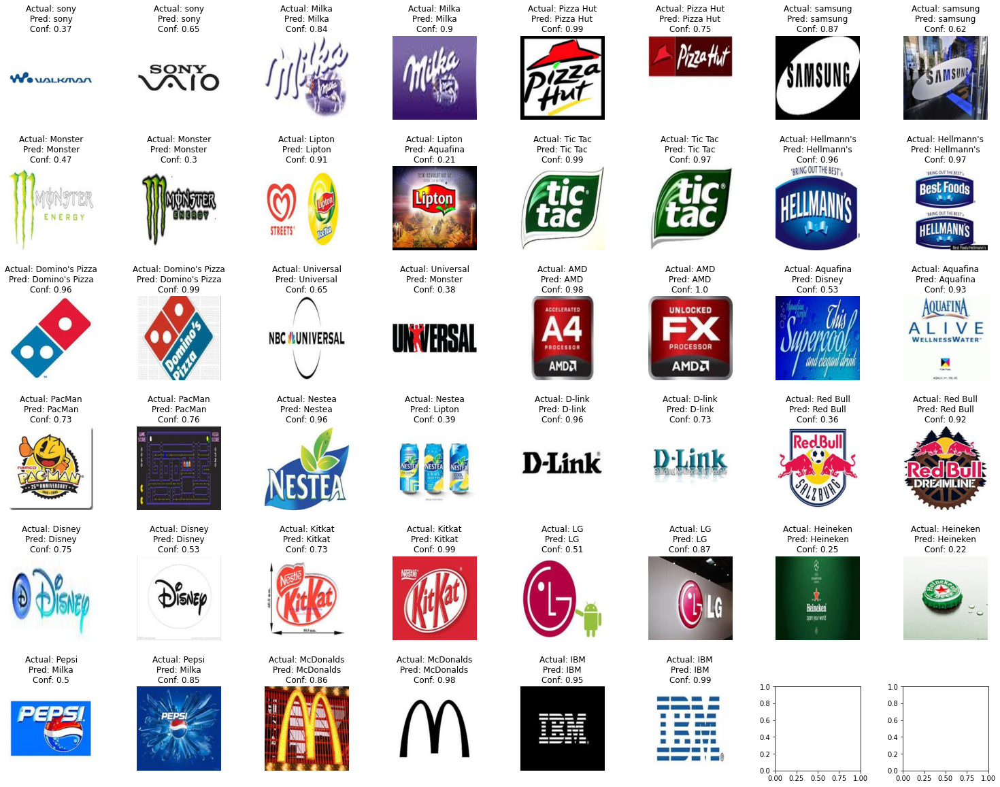

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_base = np.array([])
pred_labels_base = np.array([])
true_labels_base, pred_labels_base = evaluate_model(path,modelMN,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_base, 
                                  predicted_labels=pred_labels_base, 
                                  classes=list(set(true_labels_base)))

Model Performance metrics:
------------------------------
Accuracy: 0.829
Precision: 0.8446
Recall: 0.829
F1 Score: 0.829

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.59      0.87      0.70        15
        Disney       0.85      0.73      0.79        15
        Lipton       0.73      0.73      0.73        15
           IBM       0.91      0.67      0.77        15
       samsung       0.85      0.73      0.79        15
          sony       0.75      0.80      0.77        15
        Kitkat       0.93      0.93      0.93        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       1.00      0.87      0.93        15
            LG       0.87      0.87      0.87        15
     McDonalds       0.75      0.80      0.77        15
     Universal       0.90      0.60      0.72        15
         Pepsi       0.82      0

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet Base__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __82,32%__ y un __*F-Score*__ del __82,66%__. Las clase que mejor de predijeron fueron Domino's Pizza con el un __*F-Score*__ de __100%__; Nestea, Hellmann's, D-Link con __97%__. Mientras que Disney tiene __5%__ y Universal el __65%__.

In [ ]:
# Se guarda el modelo
modelMN.save('1_MobileNet_Base.h5')

## Modificación 1: __MobileNet__ con 20 epochs

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* Base con 20 epochs en cambio de 12.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_1 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_1 = base_modelMN_1.output
# Se agrega una capa AveragePooling
w_1 = GlobalAveragePooling2D()(w_1)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_1 = Dense(1024, activation = 'relu')(w_1) 
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_1 = Dense(1024, activation = 'relu')(w_1)
# Se agrega una capa densa con 512 nodos y activado con RELU
w_1 = Dense(512, activation = 'relu')(w_1)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_1 = Dense(23, activation = 'softmax')(w_1)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_1 = Model(inputs = base_modelMN_1.input, outputs = predsW_1)

# Se imprime el resumen del modelo
modelMN_1.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_1.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_1.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_1.layers[:87]:
    layer.trainable = False
for layer in modelMN_1.layers[87:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_1.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo aumentando el número de iteraciones (epoch) a 20
num_epochs = 20
history_1 = modelMN_1.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 52s 2s/step - loss: 2.9443 - accuracy: 0.2128 - mse: 0.0405 - val_loss: 2.6691 - val_accuracy: 0.4058 - val_mse: 0.0388
Epoch 2/20
28/28 [==============================] - 57s 2s/step - loss: 2.3712 - accuracy: 0.5101 - mse: 0.0360 - val_loss: 2.2162 - val_accuracy: 0.5217 - val_mse: 0.0338
Epoch 3/20
28/28 [==============================] - 51s 2s/step - loss: 1.8741 - accuracy: 0.6730 - mse: 0.0303 - val_loss: 1.8335 - val_accuracy: 0.6377 - val_mse: 0.0290
Epoch 4/20
28/28 [==============================] - 50s 2s/step - loss: 1.4463 - accuracy: 0.7275 - mse: 0.0242 - val_loss: 1.5553 - val_accuracy: 0.6725 - val_mse: 0.0251
Epoch 5/20
28/28 [==============================] - 50s 2s/step - loss: 1.1494 - accuracy: 0.7815 - mse: 0.0196 - val_loss: 1.3458 - val_accuracy: 0.7014 - val_mse: 0.0220
Epoch 6/20
28/28 [==============================] - 49s 2s/step - loss: 0.9242 - accuracy: 0.8300 - mse: 0.0159 - val_loss: 1.1719 - val_acc

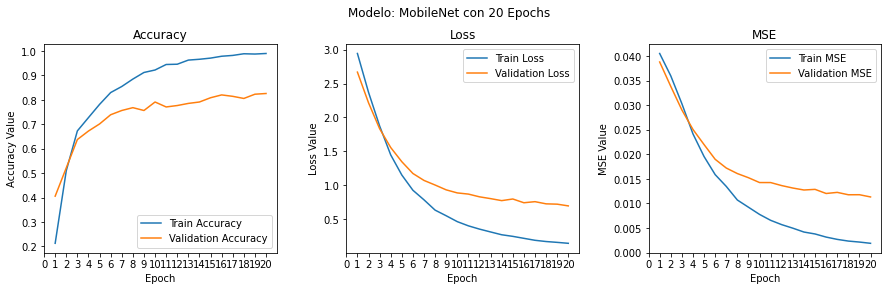

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con 20 Epochs',history_1,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4810 minutos


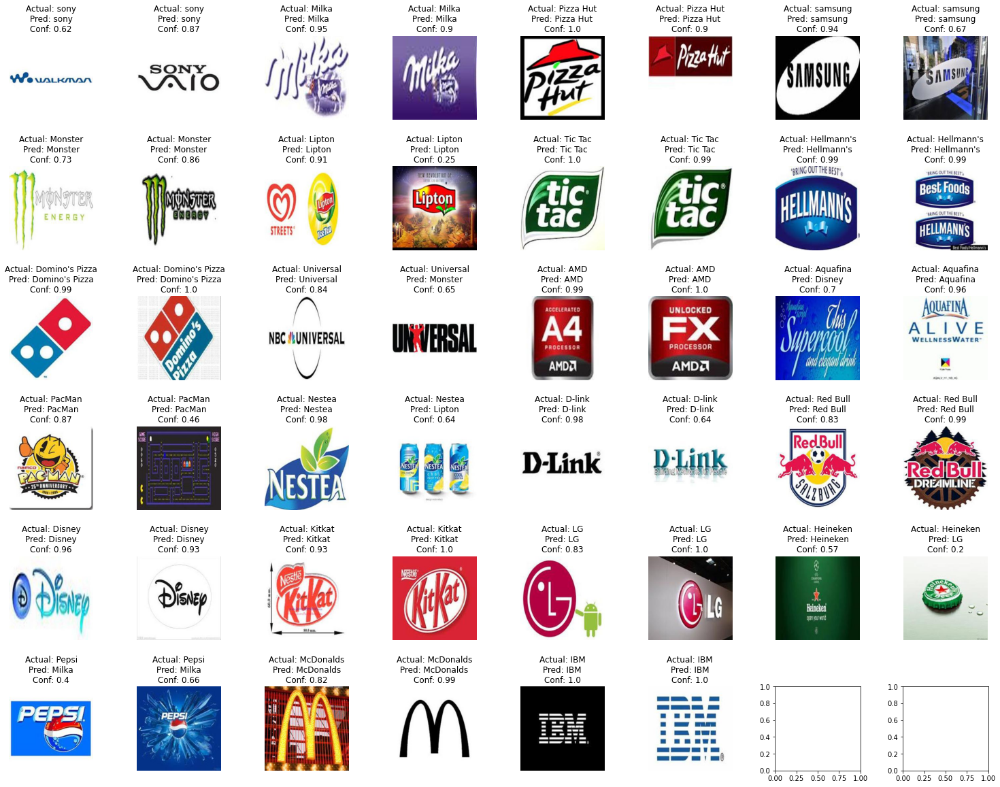

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_1 = np.array([])
pred_labels_1 = np.array([])
true_labels_1, pred_labels_1 = evaluate_model(path,modelMN_1,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_1, 
                                  predicted_labels=pred_labels_1, 
                                  classes=list(set(true_labels_1)))

Model Performance metrics:
------------------------------
Accuracy: 0.8696
Precision: 0.8795
Recall: 0.8696
F1 Score: 0.8707

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.81      0.87      0.84        15
        Disney       0.72      0.87      0.79        15
        Lipton       0.75      0.80      0.77        15
           IBM       0.93      0.87      0.90        15
       samsung       0.93      0.87      0.90        15
          sony       0.68      0.87      0.76        15
        Kitkat       0.93      0.93      0.93        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       1.00      0.80      0.89        15
            LG       0.78      0.93      0.85        15
     McDonalds       0.86      0.80      0.83        15
     Universal       0.85      0.73      0.79        15
         Pepsi       0.91    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con 20 Epochs__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, Nestea, Hellmann's con el __*F-Score*__ de __100%__; D-Link con __94%__. Mientras que Disney y AMD tienen __71%__ y Haineken el __72%__.

In [ ]:
# Se guarda el modelo
modelMN_1.save('2_MobileNet_M1.h5')

## Modificación 2: __MobileNet M1__ con optimizador Adam

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* anterior con el optimizador Adam.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_2 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_2 = base_modelMN_2.output
# Se agrega una capa AveragePooling
w_2 = GlobalAveragePooling2D()(w_2)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_2 = Dense(1024, activation = 'relu')(w_2) 
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_2 = Dense(1024, activation = 'relu')(w_2)
# Se agrega una capa densa con 512 nodos y activado con RELU
w_2 = Dense(512, activation = 'relu')(w_2)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_2 = Dense(23, activation = 'softmax')(w_2)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_2 = Model(inputs = base_modelMN_2.input, outputs = predsW_2)

# Se imprime el resumen del modelo
modelMN_2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_2.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_2.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_2.layers[:87]:
    layer.trainable = False
for layer in modelMN_2.layers[87:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_2.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo cambiando el optimizador a Adam
num_epochs = 20
history_2 = modelMN_2.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 53s 2s/step - loss: 2.0261 - accuracy: 0.4275 - mse: 0.0296 - val_loss: 1.1427 - val_accuracy: 0.6986 - val_mse: 0.0184
Epoch 2/20
28/28 [==============================] - 50s 2s/step - loss: 0.6017 - accuracy: 0.8232 - mse: 0.0107 - val_loss: 0.9851 - val_accuracy: 0.7594 - val_mse: 0.0151
Epoch 3/20
28/28 [==============================] - 50s 2s/step - loss: 0.2361 - accuracy: 0.9369 - mse: 0.0043 - val_loss: 0.9425 - val_accuracy: 0.7710 - val_mse: 0.0142
Epoch 4/20
28/28 [==============================] - 58s 2s/step - loss: 0.0978 - accuracy: 0.9775 - mse: 0.0019 - val_loss: 0.8856 - val_accuracy: 0.8058 - val_mse: 0.0123
Epoch 5/20
28/28 [==============================] - 53s 2s/step - loss: 0.0421 - accuracy: 0.9921 - mse: 7.6811e-04 - val_loss: 0.8202 - val_accuracy: 0.8087 - val_mse: 0.0114
Epoch 6/20
28/28 [==============================] - 52s 2s/step - loss: 0.0404 - accuracy: 0.9887 - mse: 7.2360e-04 - val_loss: 1.1107 -

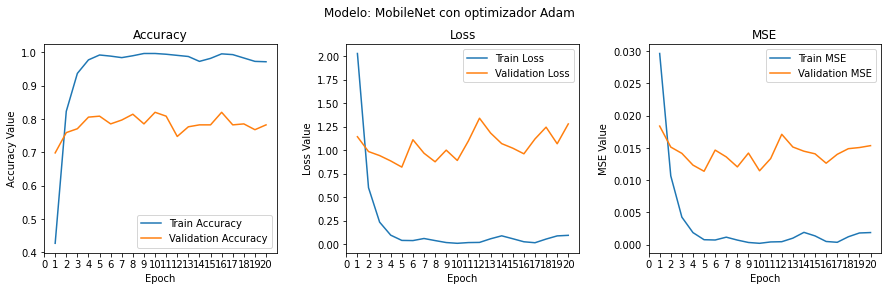

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con optimizador Adam',history_2,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5057 minutos


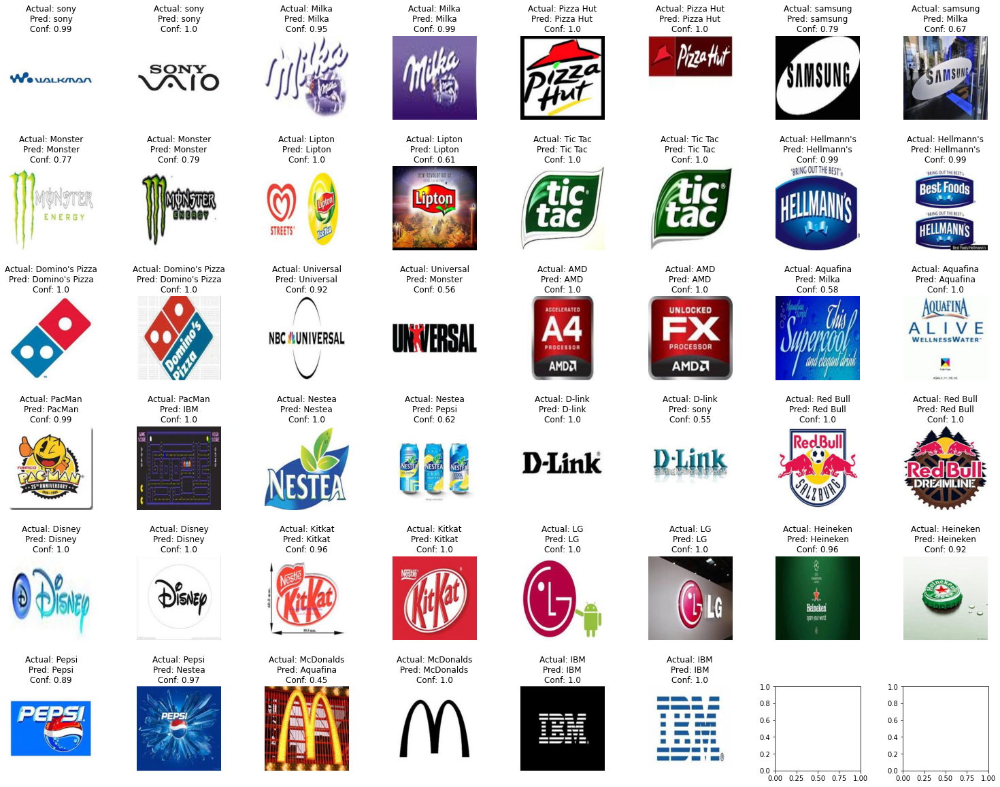

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_2 = np.array([])
pred_labels_2 = np.array([])
true_labels_2, pred_labels_2 = evaluate_model(path,modelMN_2,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_2, 
                                  predicted_labels=pred_labels_2, 
                                  classes=list(set(true_labels_2)))

Model Performance metrics:
------------------------------
Accuracy: 0.8435
Precision: 0.8615
Recall: 0.8435
F1 Score: 0.8438

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.83      0.67      0.74        15
        Disney       0.92      0.80      0.86        15
        Lipton       0.87      0.87      0.87        15
           IBM       0.87      0.87      0.87        15
       samsung       0.89      0.53      0.67        15
          sony       0.59      0.87      0.70        15
        Kitkat       0.88      0.93      0.90        15
       Tic Tac       0.88      0.93      0.90        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       0.82      0.93      0.87        15
            LG       0.94      1.00      0.97        15
     McDonalds       0.77      0.67      0.71        15
     Universal       1.00      0.67      0.80        15
         Pepsi       0.79    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con optimizador Adam__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, D-Link con el __*F-Score*__ de __100%__; KitKat con __94%__. Mientras que McDonalds tiene __53%__ y Pac-Man el __65%__.

In [ ]:
# Se guarda el modelo
modelMN_2.save('3_MobileNet_M2.h5')

## Modificación 3: __MobileNet M1__ con optimizador SGD más Image Augmentation

### Image Augmentation

In [ ]:
BATCH_SIZE = 32

# Se define ImageDataGenerator
image_aug_datagenMN = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=30, 
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   fill_mode='nearest', 
                                   horizontal_flip = 'true')

# Se define el train_generator tomando los datos desde un directorio (flow_from_directory)
# y con sus respectivos parametros, tamaño, tipo de color, ect...
train_aug_generatorMN = image_aug_datagenMN.flow_from_directory(train_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE, 
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

# Se define el validation_generator.
validation_aug_generatorMN = image_aug_datagenMN.flow_from_directory(valid_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

# Se define el evaluation_generator.
evaluation_aug_generatorMN = image_aug_datagenMN.flow_from_directory(evalu_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

Found 920 images belonging to 23 classes.
Found 345 images belonging to 23 classes.
Found 345 images belonging to 23 classes.


In [ ]:
print("Lo anterior quiere decir que vamos a entrenar nuestro modelo con: \n"
      + "Datos: " + str(train_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(train_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(train_aug_generatorMN.num_classes))

print("\nDatos: " + str(validation_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(validation_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(validation_aug_generatorMN.num_classes))

print("\nDatos: " + str(evaluation_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(evaluation_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(evaluation_aug_generatorMN.num_classes))

Lo anterior quiere decir que vamos a entrenar nuestro modelo con: 
Datos: training
Imagenes: 920
Clases: 23

Datos: training
Imagenes: 345
Clases: 23

Datos: training
Imagenes: 345
Clases: 23


### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* con 20 epochs, utilizando image augmentation debido a al poca cantidad de imágenes que se tienen.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_3 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_3 = base_modelMN_3.output
# Se agrega una capa AveragePooling
w_3 = GlobalAveragePooling2D()(w_3)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_3 = Dense(1024, activation = 'relu')(w_3) 
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_3 = Dense(1024, activation = 'relu')(w_3)
# Se agrega una capa densa con 512 nodos y activado con RELU
w_3 = Dense(512, activation = 'relu')(w_3)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_3 = Dense(23, activation = 'softmax')(w_3)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_3 = Model(inputs = base_modelMN_3.input, outputs = predsW_3)

# Se imprime el resumen del modelo
modelMN_3.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_3.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_3.layers[:87]:
    layer.trainable = False
for layer in modelMN_3.layers[87:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_3.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo con 20 epochs
num_epochs = 20
history_3 = modelMN_3.fit_generator(generator = train_aug_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_aug_generatorMN,
                          verbose=1)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 68s 2s/step - loss: 3.0314 - accuracy: 0.1509 - mse: 0.0411 - val_loss: 2.8146 - val_accuracy: 0.3130 - val_mse: 0.0399
Epoch 2/20
28/28 [==============================] - 69s 2s/step - loss: 2.6038 - accuracy: 0.4257 - mse: 0.0384 - val_loss: 2.4495 - val_accuracy: 0.4522 - val_mse: 0.0368
Epoch 3/20
28/28 [==============================] - 65s 2s/step - loss: 2.1889 - accuracy: 0.5597 - mse: 0.0343 - val_loss: 2.1008 - val_accuracy: 0.5101 - val_mse: 0.0327
Epoch 4/20
28/28 [==============================] - 64s 2s/step - loss: 1.7795 - accuracy: 0.6205 - mse: 0.0291 - val_loss: 1.7805 - val_accuracy: 0.5710 - val_mse: 0.0287
Epoch 5/20
28/28 [==============================] - 64s 2s/step - loss: 1.4879 - accuracy: 0.6768 - mse: 0.0249 - val_loss: 1.5533 - val_accuracy: 0.5913 - val_mse: 0.0257
Epoch 6/20
28/28 [==============================] - 68s 2s/step - loss: 1.2547 - accuracy: 0.7140 - mse: 0.0213 - val_loss: 1.4177 - val_acc

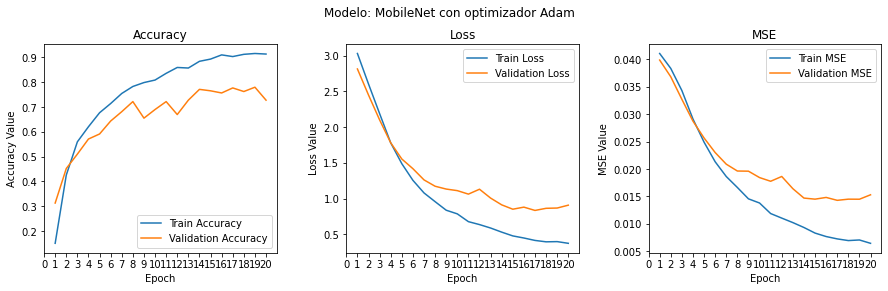

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con optimizador Adam',history_3,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5030 minutos


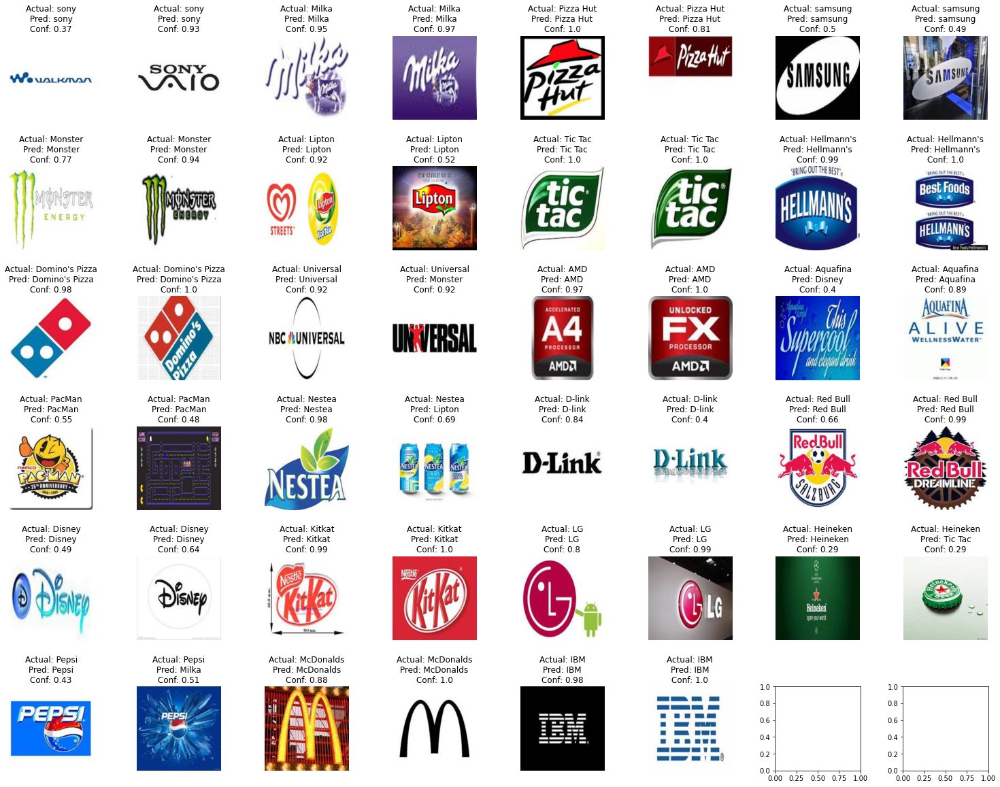

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_3 = np.array([])
pred_labels_3 = np.array([])
true_labels_3, pred_labels_3 = evaluate_model(path,modelMN_3,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_3, 
                                  predicted_labels=pred_labels_3, 
                                  classes=list(set(true_labels_3)))

Model Performance metrics:
------------------------------
Accuracy: 0.8261
Precision: 0.8525
Recall: 0.8261
F1 Score: 0.8269

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       1.00      0.60      0.75        15
        Disney       0.90      0.60      0.72        15
        Lipton       0.73      0.73      0.73        15
           IBM       1.00      0.87      0.93        15
       samsung       0.92      0.73      0.81        15
          sony       0.70      0.93      0.80        15
        Kitkat       0.62      1.00      0.77        15
       Tic Tac       0.83      1.00      0.91        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       0.68      0.87      0.76        15
            LG       0.94      1.00      0.97        15
     McDonalds       0.86      0.80      0.83        15
     Universal       0.85      0.73      0.79        15
         Pepsi       0.85    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con optimizador Adam__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, D-Link con el __*F-Score*__ de __100%__; KitKat con __94%__. Mientras que McDonalds tiene __53%__ y Pac-Man el __65%__.

In [ ]:
# Se guarda el modelo
modelMN_3.save('4_MobileNet_M3.h5')

## Modificación 4: __MobileNet M1__ con optimizador SGD más cambios varios

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* Base.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_4 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_4 = base_modelMN_4.output
# Se agrega una capa AveragePooling
w_4 = GlobalAveragePooling2D()(w_4)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_4 = Dense(1024, activation = 'relu')(w_4) 
# Se agrega una capa Dropout para desactivar un numero de neuronas de forma aleatoria
w_4 = Dropout(0.3)(w_4)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_4 = Dense(1024, activation = 'relu')(w_4)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_4 = Dense(1024, activation = 'relu')(w_4)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_4 = Dense(23, activation = 'softmax')(w_4)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_4 = Model(inputs = base_modelMN_4.input, outputs = predsW_4)

# Se imprime el resumen del modelo
modelMN_4.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_4.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_4.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 92


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_4.layers[:1]:
    layer.trainable = False
for layer in modelMN_4.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_4.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo
num_epochs = 20
history_4 = modelMN_4.fit_generator(generator = train_aug_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_aug_generatorMN,
                          verbose=1)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 214s 8s/step - loss: 3.0643 - accuracy: 0.1059 - mse: 0.0412 - val_loss: 2.9195 - val_accuracy: 0.2406 - val_mse: 0.0405
Epoch 2/20
28/28 [==============================] - 212s 8s/step - loss: 2.6591 - accuracy: 0.3243 - mse: 0.0386 - val_loss: 2.6052 - val_accuracy: 0.3130 - val_mse: 0.0380
Epoch 3/20
28/28 [==============================] - 220s 8s/step - loss: 2.1737 - accuracy: 0.4921 - mse: 0.0339 - val_loss: 2.1301 - val_accuracy: 0.5478 - val_mse: 0.0331
Epoch 4/20
28/28 [==============================] - 221s 8s/step - loss: 1.7120 - accuracy: 0.6149 - mse: 0.0279 - val_loss: 1.7370 - val_accuracy: 0.5652 - val_mse: 0.0274
Epoch 5/20
28/28 [==============================] - 223s 8s/step - loss: 1.3331 - accuracy: 0.6824 - mse: 0.0225 - val_loss: 1.3948 - val_accuracy: 0.6696 - val_mse: 0.0231
Epoch 6/20
28/28 [==============================] - 217s 8s/step - loss: 1.0594 - accuracy: 0.7376 - mse: 0.0182 - val_loss: 1.0717 - v

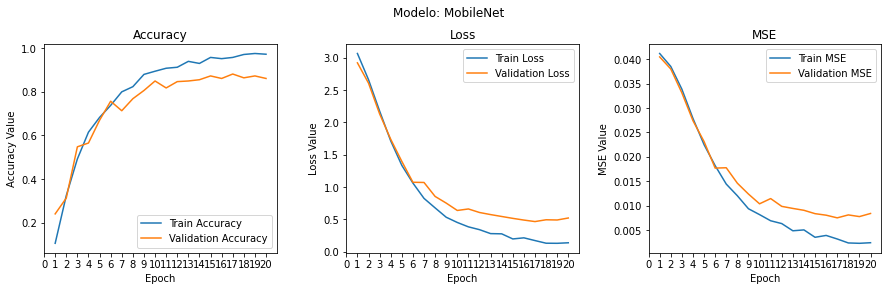

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet',history_4,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5136 minutos


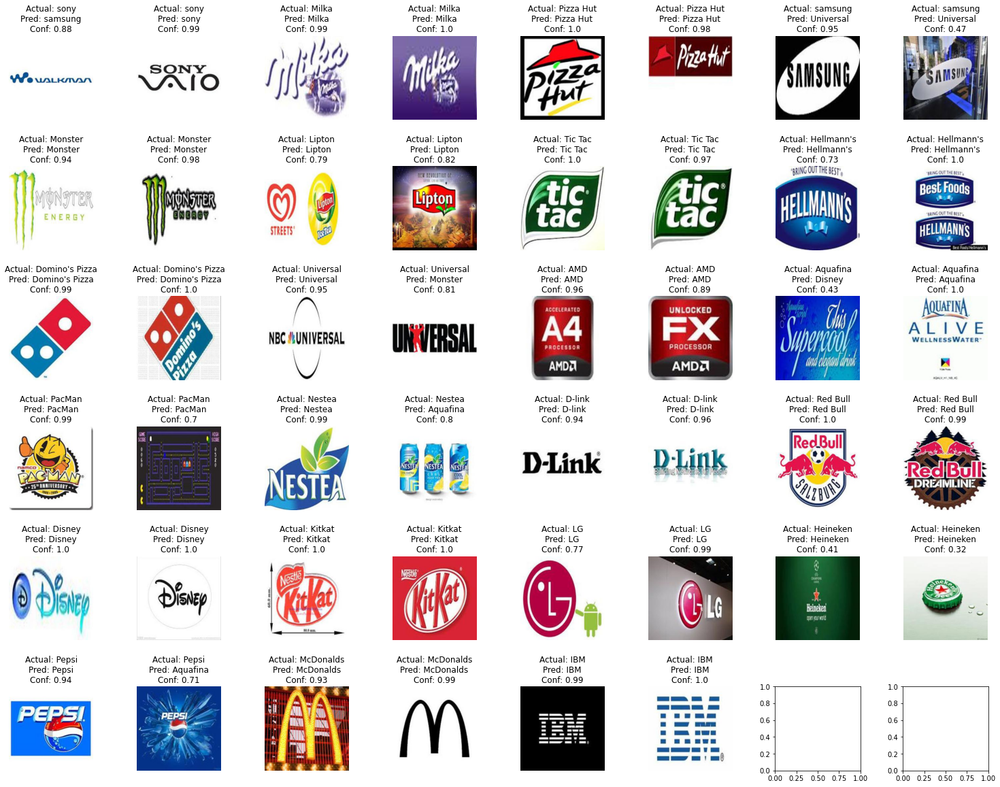

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_4 = np.array([])
pred_labels_4 = np.array([])
true_labels_4, pred_labels_4 = evaluate_model(path,modelMN_4,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_4, 
                                  predicted_labels=pred_labels_4, 
                                  classes=list(set(true_labels_4)))

Model Performance metrics:
------------------------------
Accuracy: 0.8667
Precision: 0.88
Recall: 0.8667
F1 Score: 0.868

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.86      0.80      0.83        15
        Disney       0.72      0.87      0.79        15
        Lipton       0.92      0.80      0.86        15
           IBM       1.00      0.93      0.97        15
       samsung       0.80      0.80      0.80        15
          sony       0.92      0.80      0.86        15
        Kitkat       0.65      1.00      0.79        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       1.00      0.80      0.89        15
            LG       0.94      1.00      0.97        15
     McDonalds       0.75      0.80      0.77        15
     Universal       0.77      0.67      0.71        15
         Pepsi       0.86      0

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con optimizador Adam__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, D-Link con el __*F-Score*__ de __100%__; KitKat con __94%__. Mientras que McDonalds tiene __53%__ y Pac-Man el __65%__.

In [ ]:
# Se guarda el modelo
modelMN_4.save('5_MobileNet_M4.h5')

## Modificación 5: __MobileNet M3__ con optimizador Adam más Image Augmentation

### Image Augmentation

In [ ]:
BATCH_SIZE = 32

# Se define ImageDataGenerator
image_aug_datagenMN = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=30, 
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   fill_mode='nearest', 
                                   horizontal_flip = 'true')

# Se define el train_generator tomando los datos desde un directorio (flow_from_directory)
# y con sus respectivos parametros, tamaño, tipo de color, ect...
train_aug_generatorMN = image_aug_datagenMN.flow_from_directory(train_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE, 
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

# Se define el validation_generator.
validation_aug_generatorMN = image_aug_datagenMN.flow_from_directory(valid_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

# Se define el evaluation_generator.
evaluation_aug_generatorMN = image_aug_datagenMN.flow_from_directory(evalu_dir,
                                                  target_size = (256,256), 
                                                  color_mode = 'rgb',
                                                  batch_size = BATCH_SIZE,
                                                  class_mode = 'categorical',
                                                  shuffle = True,
                                                  subset = "training",
                                                  seed=1)

Found 920 images belonging to 23 classes.
Found 345 images belonging to 23 classes.
Found 345 images belonging to 23 classes.


In [ ]:
print("Lo anterior quiere decir que vamos a entrenar nuestro modelo con: \n"
      + "Datos: " + str(train_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(train_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(train_aug_generatorMN.num_classes))

print("\nDatos: " + str(validation_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(validation_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(validation_aug_generatorMN.num_classes))

print("\nDatos: " + str(evaluation_aug_generatorMN.subset) 
      + "\nImagenes: " + str(len(evaluation_aug_generatorMN.filepaths)) 
      + "\nClases: " + str(evaluation_aug_generatorMN.num_classes))

Lo anterior quiere decir que vamos a entrenar nuestro modelo con: 
Datos: training
Imagenes: 920
Clases: 23

Datos: training
Imagenes: 345
Clases: 23

Datos: training
Imagenes: 345
Clases: 23


### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* con 20 epochs, utilizando image augmentation debido a al poca cantidad de imágenes que se tienen.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_5 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_5 = base_modelMN_5.output
# Se agrega una capa AveragePooling
w_5 = GlobalAveragePooling2D()(w_5)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_5 = Dense(1024, activation = 'relu')(w_5) 
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_5 = Dense(1024, activation = 'relu')(w_5)
# Se agrega una capa densa con 512 nodos y activado con RELU
w_5 = Dense(512, activation = 'relu')(w_5)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_5 = Dense(23, activation = 'softmax')(w_5)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_5 = Model(inputs = base_modelMN_5.input, outputs = predsW_5)

# Se imprime el resumen del modelo
modelMN_5.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_5.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_5.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_5.layers[:87]:
    layer.trainable = False
for layer in modelMN_5.layers[87:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_5.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo con 20 epochs
num_epochs = 20
history_5 = modelMN_5.fit_generator(generator = train_aug_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_aug_generatorMN,
                          verbose=1)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 66s 2s/step - loss: 2.2893 - accuracy: 0.3896 - mse: 0.0329 - val_loss: 1.4168 - val_accuracy: 0.5913 - val_mse: 0.0225
Epoch 2/20
28/28 [==============================] - 66s 2s/step - loss: 1.0081 - accuracy: 0.7117 - mse: 0.0175 - val_loss: 1.2856 - val_accuracy: 0.6435 - val_mse: 0.0206
Epoch 3/20
28/28 [==============================] - 66s 2s/step - loss: 0.6263 - accuracy: 0.8255 - mse: 0.0112 - val_loss: 0.9686 - val_accuracy: 0.7478 - val_mse: 0.0150
Epoch 4/20
28/28 [==============================] - 65s 2s/step - loss: 0.3814 - accuracy: 0.8919 - mse: 0.0072 - val_loss: 1.0083 - val_accuracy: 0.7565 - val_mse: 0.0155
Epoch 5/20
28/28 [==============================] - 66s 2s/step - loss: 0.3035 - accuracy: 0.9096 - mse: 0.0058 - val_loss: 0.7674 - val_accuracy: 0.8029 - val_mse: 0.0127
Epoch 6/20
28/28 [==============================] - 65s 2s/step - loss: 0.2412 - accuracy: 0.9257 - mse: 0.0050 - val_loss: 1.1330 - val_acc

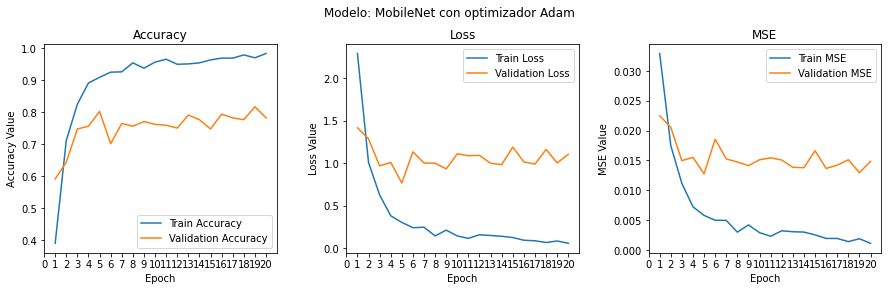

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con optimizador Adam',history_5,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4762 minutos


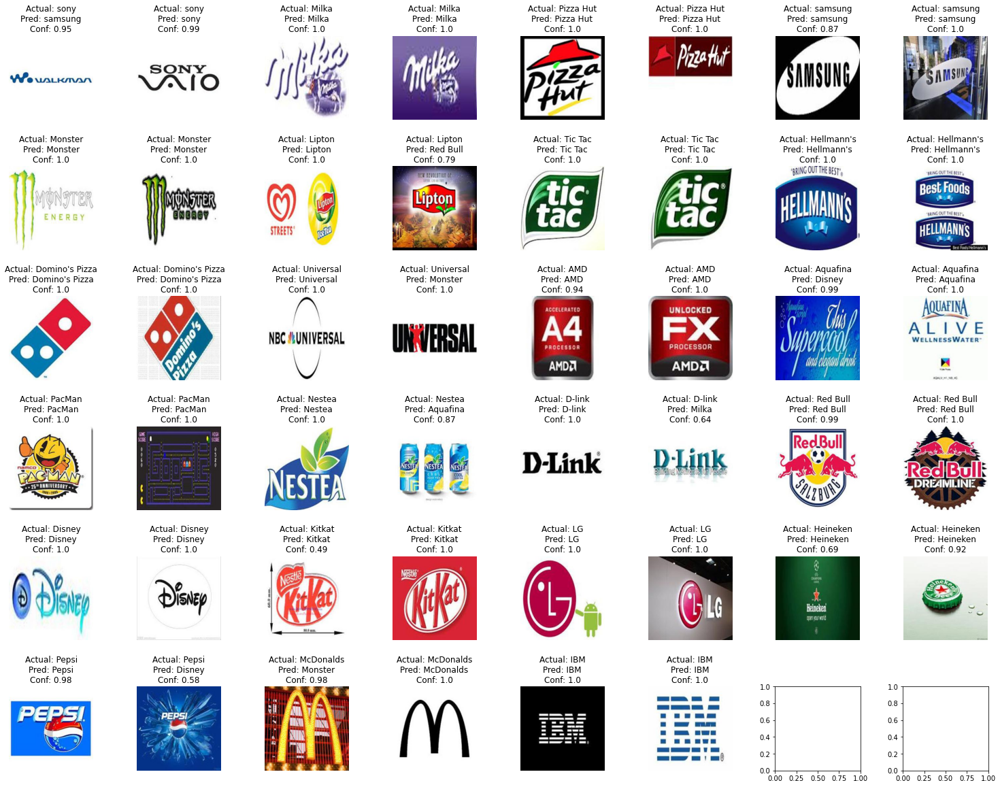

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_5 = np.array([])
pred_labels_5 = np.array([])
true_labels_5, pred_labels_5 = evaluate_model(path,modelMN_5,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_5, 
                                  predicted_labels=pred_labels_5, 
                                  classes=list(set(true_labels_5)))

Model Performance metrics:
------------------------------
Accuracy: 0.8377
Precision: 0.8657
Recall: 0.8377
F1 Score: 0.8425

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.80      0.80      0.80        15
        Disney       0.69      0.73      0.71        15
        Lipton       0.79      0.73      0.76        15
           IBM       0.93      0.93      0.93        15
       samsung       0.86      0.80      0.83        15
          sony       0.80      0.80      0.80        15
        Kitkat       1.00      1.00      1.00        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       1.00      0.87      0.93        15
            LG       0.81      0.87      0.84        15
     McDonalds       1.00      0.73      0.85        15
     Universal       0.61      0.73      0.67        15
         Pepsi       1.00    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con optimizador Adam__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, D-Link con el __*F-Score*__ de __100%__; KitKat con __94%__. Mientras que McDonalds tiene __53%__ y Pac-Man el __65%__.

In [ ]:
# Se guarda el modelo
modelMN_5.save('6_MobileNet_M5.h5')

## Modificación 6: __MobileNet M4__ con optimizador Adam más cambios varios

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* Base.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_6 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_6 = base_modelMN_6.output
# Se agrega una capa AveragePooling
w_6 = GlobalAveragePooling2D()(w_6)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_6 = Dense(1024, activation = 'relu')(w_6) 
# Se agrega una capa Dropout para desactivar un numero de neuronas de forma aleatoria
w_6 = Dropout(0.3)(w_6)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_6 = Dense(1024, activation = 'relu')(w_6)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_6 = Dense(1024, activation = 'relu')(w_6)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_6 = Dense(23, activation = 'softmax')(w_6)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_6 = Model(inputs = base_modelMN_6.input, outputs = predsW_6)

# Se imprime el resumen del modelo
modelMN_6.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_6.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_6.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 92


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_6.layers[:1]:
    layer.trainable = False
for layer in modelMN_6.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_6.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo
num_epochs = 20
history_6 = modelMN_6.fit_generator(generator = train_aug_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_aug_generatorMN,
                          verbose=1)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 213s 8s/step - loss: 2.4520 - accuracy: 0.3209 - mse: 0.0345 - val_loss: 7.3595 - val_accuracy: 0.0928 - val_mse: 0.0675
Epoch 2/20
28/28 [==============================] - 207s 7s/step - loss: 1.1691 - accuracy: 0.6644 - mse: 0.0197 - val_loss: 10.2453 - val_accuracy: 0.0899 - val_mse: 0.0692
Epoch 3/20
28/28 [==============================] - 207s 7s/step - loss: 0.8311 - accuracy: 0.7658 - mse: 0.0145 - val_loss: 4.3066 - val_accuracy: 0.3362 - val_mse: 0.0443
Epoch 4/20
28/28 [==============================] - 208s 7s/step - loss: 0.7780 - accuracy: 0.7894 - mse: 0.0134 - val_loss: 4.6663 - val_accuracy: 0.3449 - val_mse: 0.0475
Epoch 5/20
28/28 [==============================] - 208s 7s/step - loss: 0.5818 - accuracy: 0.8322 - mse: 0.0105 - val_loss: 4.0586 - val_accuracy: 0.3652 - val_mse: 0.0442
Epoch 6/20
28/28 [==============================] - 211s 8s/step - loss: 0.6284 - accuracy: 0.8300 - mse: 0.0107 - val_loss: 3.0816 - 

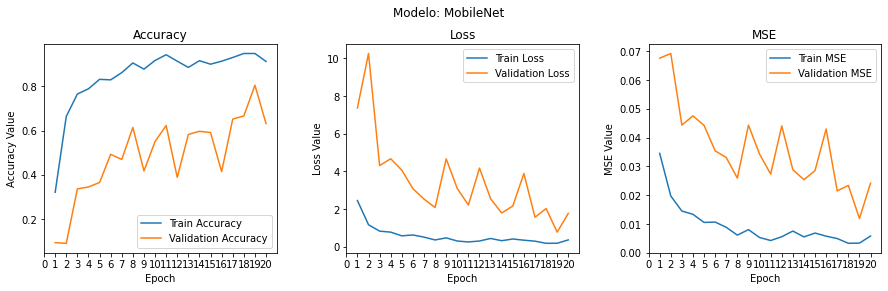

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet',history_6,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5259 minutos


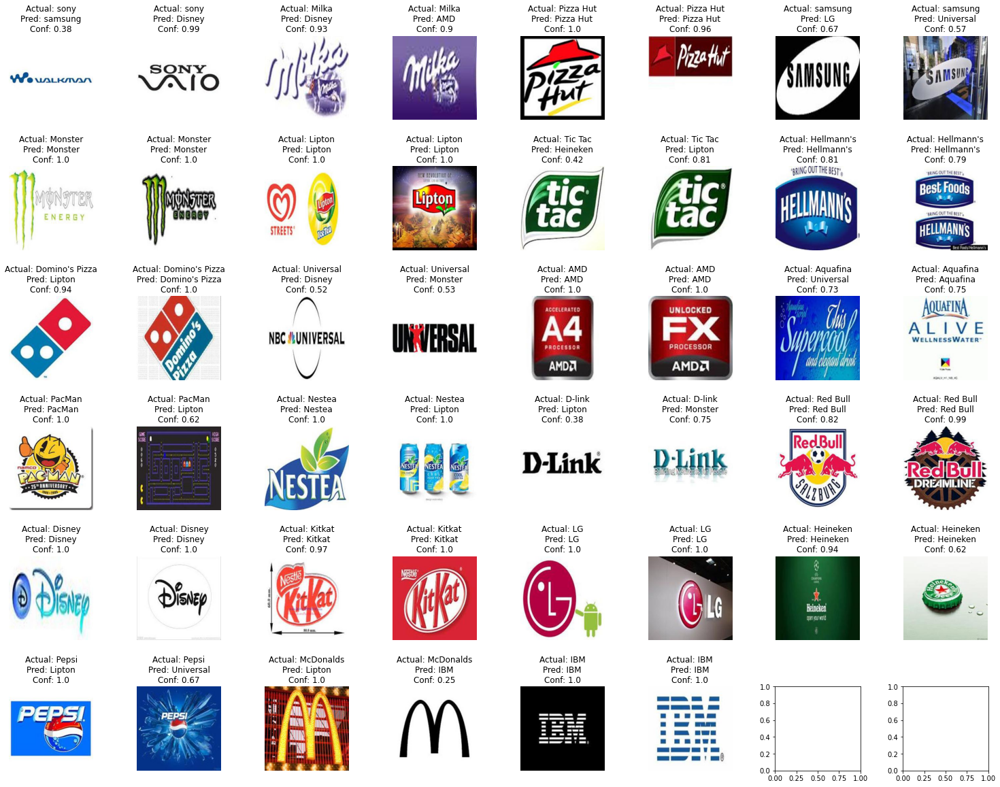

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_6 = np.array([])
pred_labels_6 = np.array([])
true_labels_6, pred_labels_6 = evaluate_model(path,modelMN_6,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_6, 
                                  predicted_labels=pred_labels_6, 
                                  classes=list(set(true_labels_6)))

Model Performance metrics:
------------------------------
Accuracy: 0.5739
Precision: 0.7317
Recall: 0.5739
F1 Score: 0.5566

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       1.00      0.47      0.64        15
        Disney       0.52      0.93      0.67        15
        Lipton       0.17      0.93      0.29        15
           IBM       0.85      0.73      0.79        15
       samsung       0.14      0.07      0.09        15
          sony       1.00      0.20      0.33        15
        Kitkat       1.00      0.80      0.89        15
       Tic Tac       0.00      0.00      0.00        15
Domino's Pizza       1.00      0.87      0.93        15
        Nestea       1.00      0.93      0.97        15
            LG       0.68      1.00      0.81        15
     McDonalds       1.00      0.13      0.24        15
     Universal       0.40      0.53      0.46        15
         Pepsi       1.00    

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con optimizador Adam__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, D-Link con el __*F-Score*__ de __100%__; KitKat con __94%__. Mientras que McDonalds tiene __53%__ y Pac-Man el __65%__.

In [ ]:
# Se guarda el modelo
modelMN_6.save('7_MobileNet_M6.h5')

## Modificación 7: __MobileNet M1__ con 20 epochs, descongelado y no dropout

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet__* Base con 20 epochs, descongelado y no Dropout.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_7 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_7 = base_modelMN_7.output
# Se agrega una capa AveragePooling
w_7 = GlobalAveragePooling2D()(w_7)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_7 = Dense(1024, activation = 'relu')(w_7)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_7 = Dense(1024, activation = 'relu')(w_7)
# Se agrega una capa densa con 512 nodos y activado con RELU
w_7 = Dense(512, activation = 'relu')(w_7)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_7 = Dense(23, activation = 'softmax')(w_7)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_7 = Model(inputs = base_modelMN_7.input, outputs = predsW_7)

# Se imprime el resumen del modelo
modelMN_7.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_7.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_7.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_7.layers[:1]:
    layer.trainable = False
for layer in modelMN_7.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_7.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo aumentando el número de iteraciones (epoch) a 20
num_epochs = 20
history_7 = modelMN_7.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 203s 7s/step - loss: 2.8727 - accuracy: 0.2466 - mse: 0.0397 - val_loss: 2.7355 - val_accuracy: 0.3333 - val_mse: 0.0389
Epoch 2/20
28/28 [==============================] - 199s 7s/step - loss: 2.0635 - accuracy: 0.6081 - mse: 0.0323 - val_loss: 2.1884 - val_accuracy: 0.4725 - val_mse: 0.0333
Epoch 3/20
28/28 [==============================] - 199s 7s/step - loss: 1.2840 - accuracy: 0.7928 - mse: 0.0216 - val_loss: 1.7324 - val_accuracy: 0.5420 - val_mse: 0.0277
Epoch 4/20
28/28 [==============================] - 201s 7s/step - loss: 0.8159 - accuracy: 0.8682 - mse: 0.0138 - val_loss: 1.2020 - val_accuracy: 0.7275 - val_mse: 0.0197
Epoch 5/20
28/28 [==============================] - 200s 7s/step - loss: 0.4901 - accuracy: 0.9381 - mse: 0.0082 - val_loss: 1.0230 - val_accuracy: 0.7362 - val_mse: 0.0168
Epoch 6/20
28/28 [==============================] - 200s 7s/step - loss: 0.3131 - accuracy: 0.9651 - mse: 0.0049 - val_loss: 0.8234 - v

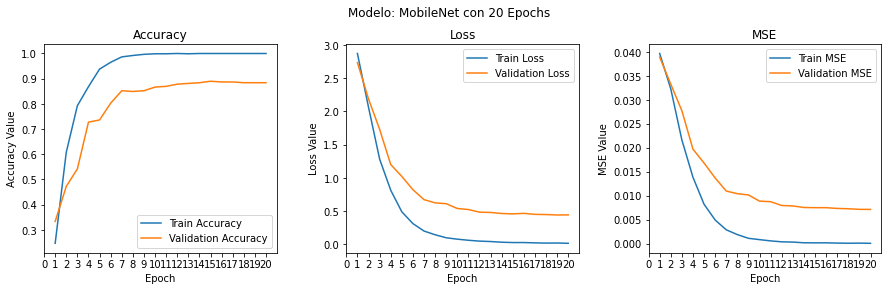

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con 20 Epochs',history_7,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4848 minutos


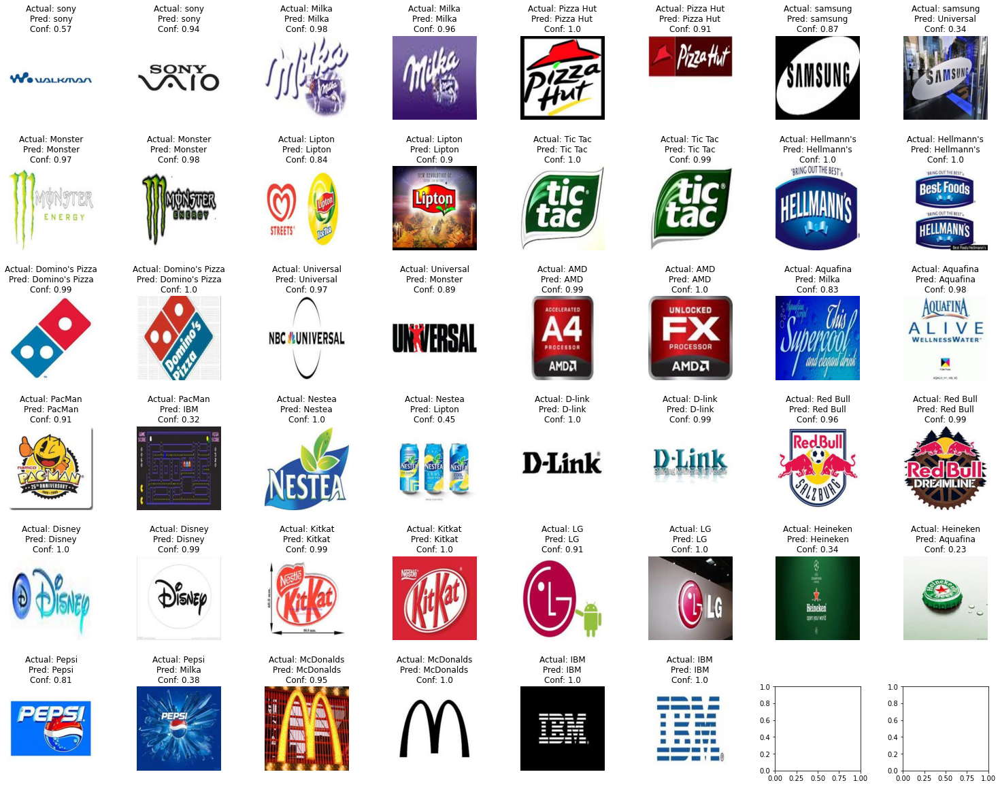

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_7 = np.array([])
pred_labels_7 = np.array([])
true_labels_7, pred_labels_7 = evaluate_model(path,modelMN_7,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_7, 
                                  predicted_labels=pred_labels_7, 
                                  classes=list(set(true_labels_7)))

Model Performance metrics:
------------------------------
Accuracy: 0.8928
Precision: 0.8965
Recall: 0.8928
F1 Score: 0.8922

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.83      0.67      0.74        15
        Disney       1.00      0.93      0.97        15
        Lipton       0.87      0.87      0.87        15
           IBM       0.93      0.93      0.93        15
       samsung       0.86      0.80      0.83        15
          sony       0.88      0.93      0.90        15
        Kitkat       1.00      1.00      1.00        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       0.94      1.00      0.97        15
        Nestea       1.00      0.87      0.93        15
            LG       0.88      1.00      0.94        15
     McDonalds       0.86      0.80      0.83        15
     Universal       0.92      0.73      0.81        15
         Pepsi       0.80    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con 20 Epochs__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, Nestea, Hellmann's con el __*F-Score*__ de __100%__; D-Link con __94%__. Mientras que Disney y AMD tienen __71%__ y Haineken el __72%__.

In [ ]:
# Se guarda el modelo
modelMN_7.save('8_MobileNet_M7.h5')

## Modificación 8: __MobileNet M7__ con 1024 nodos en la última capa Dense

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet M7__* con 1024 nodos en la última capa Dense.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_8 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_8 = base_modelMN_8.output
# Se agrega una capa AveragePooling
w_8 = GlobalAveragePooling2D()(w_8)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_8 = Dense(1024, activation = 'relu')(w_8)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_8 = Dense(1024, activation = 'relu')(w_8)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_8 = Dense(1024, activation = 'relu')(w_8)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_8 = Dense(23, activation = 'softmax')(w_8)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_8 = Model(inputs = base_modelMN_8.input, outputs = predsW_8)

# Se imprime el resumen del modelo
modelMN_8.summary()

Model: "model_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_8.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_8.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_8.layers[:1]:
    layer.trainable = False
for layer in modelMN_8.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_8.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo aumentando el número de iteraciones (epoch) a 20
num_epochs = 20
history_8 = modelMN_8.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 197s 7s/step - loss: 2.9046 - accuracy: 0.2331 - mse: 0.0401 - val_loss: 2.8356 - val_accuracy: 0.2551 - val_mse: 0.0400
Epoch 2/20
28/28 [==============================] - 195s 7s/step - loss: 2.1044 - accuracy: 0.6284 - mse: 0.0329 - val_loss: 2.3547 - val_accuracy: 0.4174 - val_mse: 0.0357
Epoch 3/20
28/28 [==============================] - 197s 7s/step - loss: 1.3798 - accuracy: 0.7714 - mse: 0.0233 - val_loss: 1.7779 - val_accuracy: 0.5768 - val_mse: 0.0279
Epoch 4/20
28/28 [==============================] - 196s 7s/step - loss: 0.8761 - accuracy: 0.8694 - mse: 0.0149 - val_loss: 1.3769 - val_accuracy: 0.6841 - val_mse: 0.0218
Epoch 5/20
28/28 [==============================] - 196s 7s/step - loss: 0.5791 - accuracy: 0.9122 - mse: 0.0097 - val_loss: 1.0951 - val_accuracy: 0.7507 - val_mse: 0.0176
Epoch 6/20
28/28 [==============================] - 199s 7s/step - loss: 0.3863 - accuracy: 0.9561 - mse: 0.0063 - val_loss: 0.9654 - v

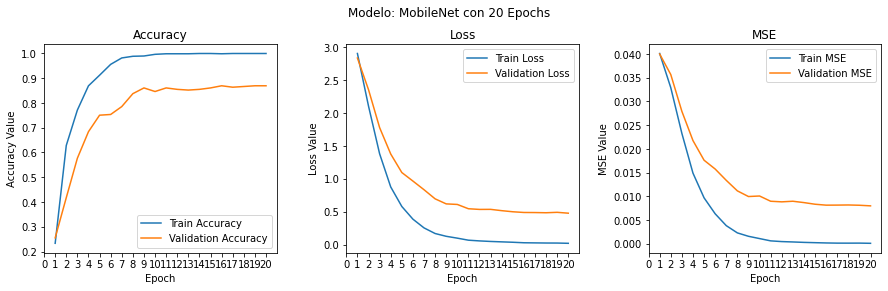

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet con 20 Epochs',history_8,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.4941 minutos


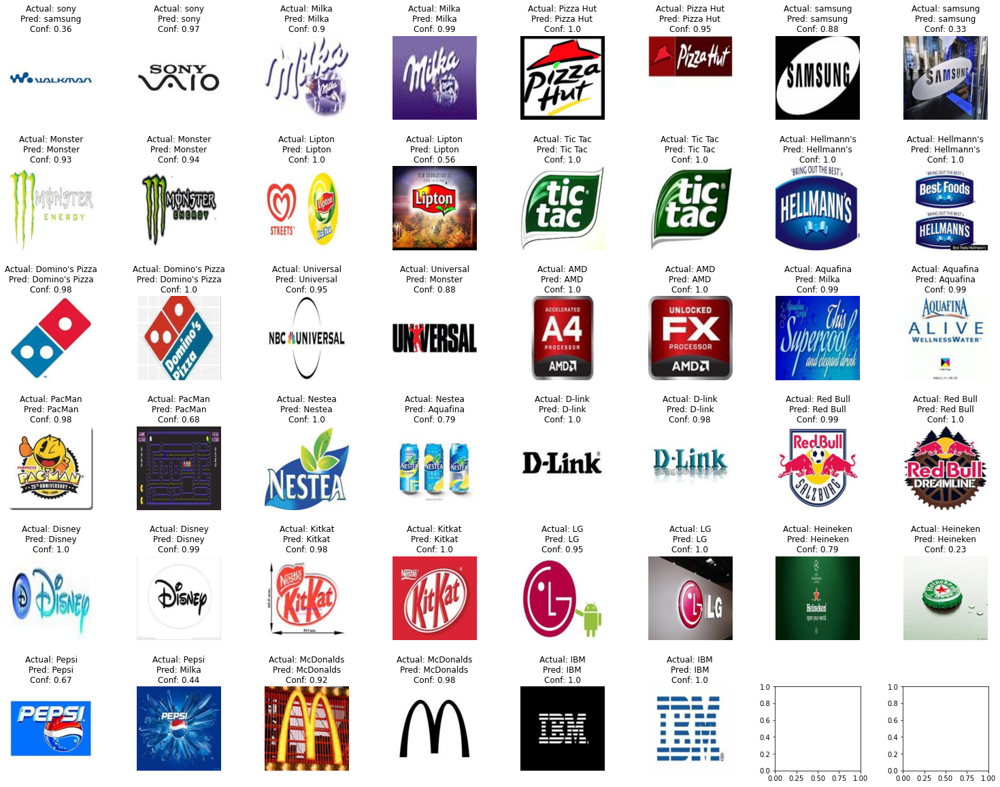

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_8 = np.array([])
pred_labels_8 = np.array([])
true_labels_8, pred_labels_8 = evaluate_model(path,modelMN_8,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_8, 
                                  predicted_labels=pred_labels_8, 
                                  classes=list(set(true_labels_8)))

Model Performance metrics:
------------------------------
Accuracy: 0.9043
Precision: 0.9101
Recall: 0.9043
F1 Score: 0.9044

Model Classification report:
------------------------------
                precision    recall  f1-score   support

        PacMan       0.87      0.87      0.87        15
        Disney       0.93      0.87      0.90        15
        Lipton       0.87      0.87      0.87        15
           IBM       1.00      0.93      0.97        15
       samsung       0.78      0.93      0.85        15
          sony       0.80      0.80      0.80        15
        Kitkat       1.00      1.00      1.00        15
       Tic Tac       1.00      1.00      1.00        15
Domino's Pizza       1.00      1.00      1.00        15
        Nestea       1.00      0.87      0.93        15
            LG       0.88      0.93      0.90        15
     McDonalds       0.92      0.80      0.86        15
     Universal       0.92      0.73      0.81        15
         Pepsi       0.92    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con 20 Epochs__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, Nestea, Hellmann's con el __*F-Score*__ de __100%__; D-Link con __94%__. Mientras que Disney y AMD tienen __71%__ y Haineken el __72%__.

In [ ]:
# Se guarda el modelo
modelMN_8.save('9_MobileNet_M8.h5')

## Modificación 9: __MobileNet M8__ con 2048 nodos en la tres últimas capas Dense.

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet M8__* con 2048 nodos en la tres últimas capas Dense.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_9 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_9 = base_modelMN_9.output
# Se agrega una capa AveragePooling
w_9 = GlobalAveragePooling2D()(w_9)
# Se agrega una capa densa con 2048 nodos y activado con RELU
w_9 = Dense(2048, activation = 'relu')(w_9)
# Se agrega una capa densa con 2048 nodos y activado con RELU
w_9 = Dense(2048, activation = 'relu')(w_9)
# Se agrega una capa densa con 2048 nodos y activado con RELU
w_9 = Dense(2048, activation = 'relu')(w_9)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_9 = Dense(23, activation = 'softmax')(w_9)

17235968/17225924 [==============================] - 0s 0us/step


In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_9 = Model(inputs = base_modelMN_9.input, outputs = predsW_9)

# Se imprime el resumen del modelo
modelMN_9.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0     

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_9.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_9.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_9.layers[:1]:
    layer.trainable = False
for layer in modelMN_9.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_9.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo aumentando el número de iteraciones (epoch) a 20
num_epochs = 20
history_9 = modelMN_9.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 219s 8s/step - loss: 2.8730 - accuracy: 0.2624 - mse: 0.0399 - val_loss: 2.7496 - val_accuracy: 0.3942 - val_mse: 0.0395
Epoch 2/20
28/28 [==============================] - 214s 8s/step - loss: 2.0550 - accuracy: 0.6025 - mse: 0.0322 - val_loss: 2.2627 - val_accuracy: 0.5043 - val_mse: 0.0349
Epoch 3/20
28/28 [==============================] - 214s 8s/step - loss: 1.3957 - accuracy: 0.7815 - mse: 0.0235 - val_loss: 1.6630 - val_accuracy: 0.6580 - val_mse: 0.0270
Epoch 4/20
28/28 [==============================] - 215s 8s/step - loss: 0.8833 - accuracy: 0.8525 - mse: 0.0152 - val_loss: 1.2398 - val_accuracy: 0.7188 - val_mse: 0.0204
Epoch 5/20
28/28 [==============================] - 213s 8s/step - loss: 0.5566 - accuracy: 0.9212 - mse: 0.0094 - val_loss: 0.9648 - val_accuracy: 0.7768 - val_mse: 0.0160
Epoch 6/20
28/28 [==============================] - 212s 8s/step - loss: 0.3782 - accuracy: 0.9505 - mse: 0.0061 - val_loss: 0.8573 - v

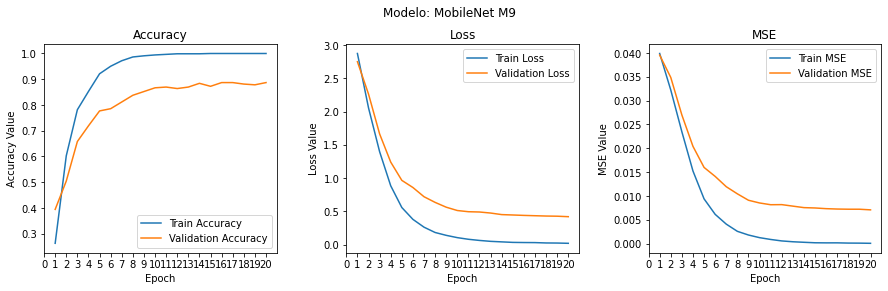

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet M9',history_9,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5706 minutos


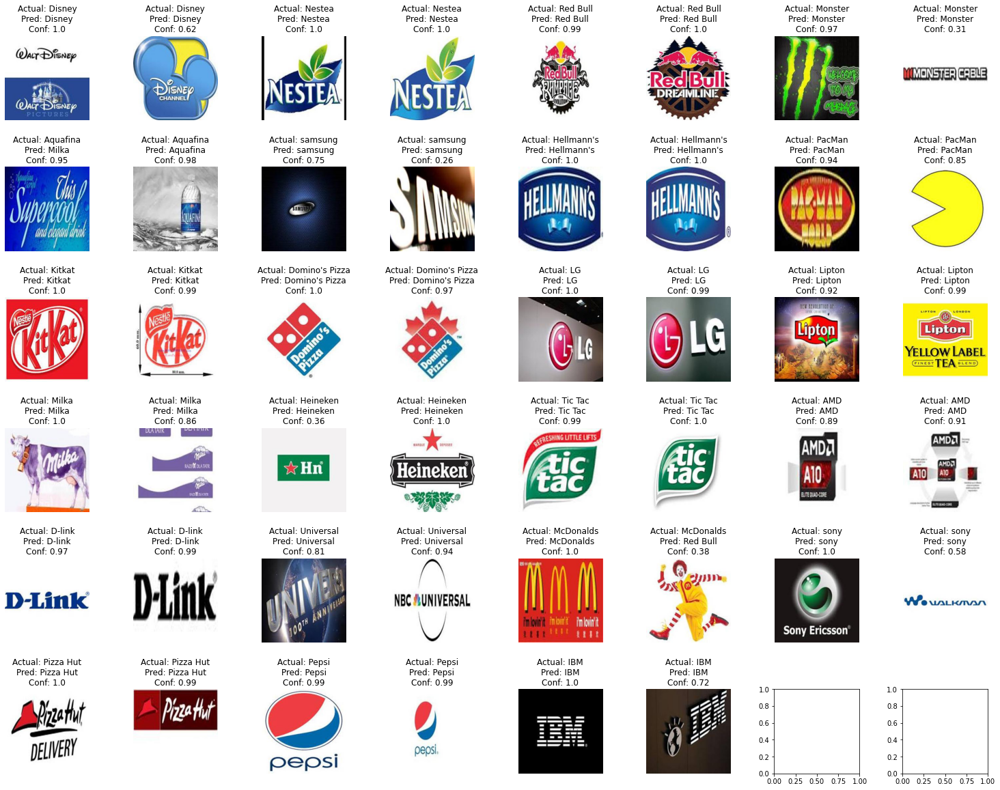

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_9 = np.array([])
pred_labels_9 = np.array([])
true_labels_9, pred_labels_9 = evaluate_model(path,modelMN_9,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_9, 
                                  predicted_labels=pred_labels_9, 
                                  classes=list(set(true_labels_9)))

Model Performance metrics:
------------------------------
Accuracy: 0.9072
Precision: 0.9143
Recall: 0.9072
F1 Score: 0.9078

Model Classification report:
------------------------------
                precision    recall  f1-score   support

           IBM       0.93      0.93      0.93        15
     Pizza Hut       0.92      0.80      0.86        15
     McDonalds       0.92      0.80      0.86        15
            LG       0.93      0.93      0.93        15
      Red Bull       0.93      0.93      0.93        15
        Kitkat       1.00      1.00      1.00        15
      Aquafina       0.72      0.87      0.79        15
      Heineken       0.93      0.87      0.90        15
    Hellmann's       1.00      1.00      1.00        15
        PacMan       0.86      0.80      0.83        15
        Lipton       1.00      0.87      0.93        15
           AMD       1.00      1.00      1.00        15
        Nestea       0.87      0.87      0.87        15
        D-link       0.94    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet con 20 Epochs__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __83,48%__ y un __*F-Score*__ del __83,56%__. Las clase que mejor de predijeron fueron Domino's Pizza, Nestea, Hellmann's con el __*F-Score*__ de __100%__; D-Link con __94%__. Mientras que Disney y AMD tienen __71%__ y Haineken el __72%__.

In [ ]:
# Se guarda el modelo
modelMN_9.save('10_MobileNet_M9.h5')

## Modificación 10: __MobileNet M9__ con 1024, 2048 y 4096 nodos en las últimas tres capas Dense.

### Construcción del modelo:

Se va a modificar el modelo *__MobileNet M9__* con 1024, 2048 y 4096 nodos en las últimas tres capas Dense.

In [ ]:
# Se define el modelo BASE y se descarta la última capa
base_modelMN_10 = mobilenet.MobileNet(weights = 'imagenet', include_top = False) 
w_10 = base_modelMN_10.output
# Se agrega una capa AveragePooling
w_10 = GlobalAveragePooling2D()(w_10)
# Se agrega una capa densa con 1024 nodos y activado con RELU
w_10 = Dense(1024, activation = 'relu')(w_10)
# Se agrega una capa densa con 2048 nodos y activado con RELU
w_10 = Dense(2048, activation = 'relu')(w_10)
# Se agrega una capa densa con 4096 nodos y activado con RELU
w_10 = Dense(4096, activation = 'relu')(w_10)
# Por último, se agrega una capa densa con el número de categorias que queremos predecir, en ese caso 23.
predsW_10 = Dense(23, activation = 'softmax')(w_10)

In [ ]:
# Se define el modelo con el input el modelo base y su respectivo ouput con preds:
modelMN_10 = Model(inputs = base_modelMN_10.input, outputs = predsW_10)

# Se imprime el resumen del modelo
modelMN_10.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
conv1 (Conv2D)               (None, None, None, 32)    864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, None, None, 32)    128       
_________________________________________________________________
conv1_relu (ReLU)            (None, None, None, 32)    0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)    288       
_________________________________________________________________
conv_dw_1_bn (BatchNormaliza (None, None, None, 32)    128       
_________________________________________________________________
conv_dw_1_relu (ReLU)        (None, None, None, 32)    0   

In [ ]:
# Se cuenta cuantas capas tiene mi modelo base:
print("Las capas que tiene mi 'modelo base' son: " + str(len(base_modelMN_10.layers)) + "\n")

# Se cuenta cuantas capas tiene el modelo:
print("Las capas que tiene mi 'modelo' son: " + str(len(modelMN_10.layers)))

Las capas que tiene mi 'modelo base' son: 86

Las capas que tiene mi 'modelo' son: 91


In [ ]:
# Se congelan las capas del modelo de la siguiente manera:
for layer in modelMN_10.layers[:1]:
    layer.trainable = False
for layer in modelMN_10.layers[1:]:
    layer.trainable = True

### Entrenamiento del modelo:

In [ ]:
# Se compila el modelo
modelMN_10.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy', 'mse'])

# Se realiza el cálculo del número total de pasos
step_size_trainMN = (train_generatorMN.n // train_generatorMN.batch_size)

In [ ]:
# Se definine un contador de tiempo para validar cuando tarda en entrenar el modelo
tic = time.perf_counter()

# Se entrena el modelo aumentando el número de iteraciones (epoch) a 20
num_epochs = 20
history_10 = modelMN_10.fit_generator(generator = train_generatorMN, 
                          steps_per_epoch = step_size_trainMN,
                          epochs = num_epochs, 
                          validation_data = validation_generatorMN)

# Se define el contador una vez termina de entrenar el modelo
toc = time.perf_counter()

# Se imprime lo que tardo el modelo
print(f"Entrenando el modelo tarda alrededor de: {((toc - tic)/60):0.4f} minutos")

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
28/28 [==============================] - 217s 8s/step - loss: 2.9527 - accuracy: 0.1937 - mse: 0.0406 - val_loss: 2.8540 - val_accuracy: 0.2812 - val_mse: 0.0402
Epoch 2/20
28/28 [==============================] - 212s 8s/step - loss: 2.3159 - accuracy: 0.5709 - mse: 0.0353 - val_loss: 2.4059 - val_accuracy: 0.4957 - val_mse: 0.0366
Epoch 3/20
28/28 [==============================] - 216s 8s/step - loss: 1.6533 - accuracy: 0.7376 - mse: 0.0273 - val_loss: 1.8737 - val_accuracy: 0.5507 - val_mse: 0.0301
Epoch 4/20
28/28 [==============================] - 219s 8s/step - loss: 1.1043 - accuracy: 0.8225 - mse: 0.0188 - val_loss: 1.4438 - val_accuracy: 0.6667 - val_mse: 0.0233
Epoch 5/20
28/28 [==============================] - 217s 8s/step - loss: 0.7240 - accuracy: 0.8873 - mse: 0.0123 - val_loss: 1.0633 - val_accuracy: 0.7565 - val_mse: 0.0178
Epoch 6/20
28/28 [==============================] - 215s 8s/step - loss: 0.4808 - accuracy: 0.9234 - mse: 0.0079 - val_loss: 0.8965 - v

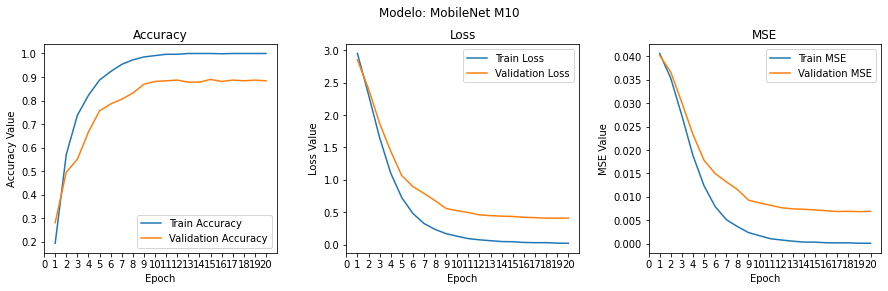

In [ ]:
# Generación de gráficas de comportamiento de métricas del modelo
gen_graphs_metrics('MobileNet M10',history_10,num_epochs)

### Evaluación del modelo:


Evaluar el modelo tarda alrededor de: 0.5946 minutos


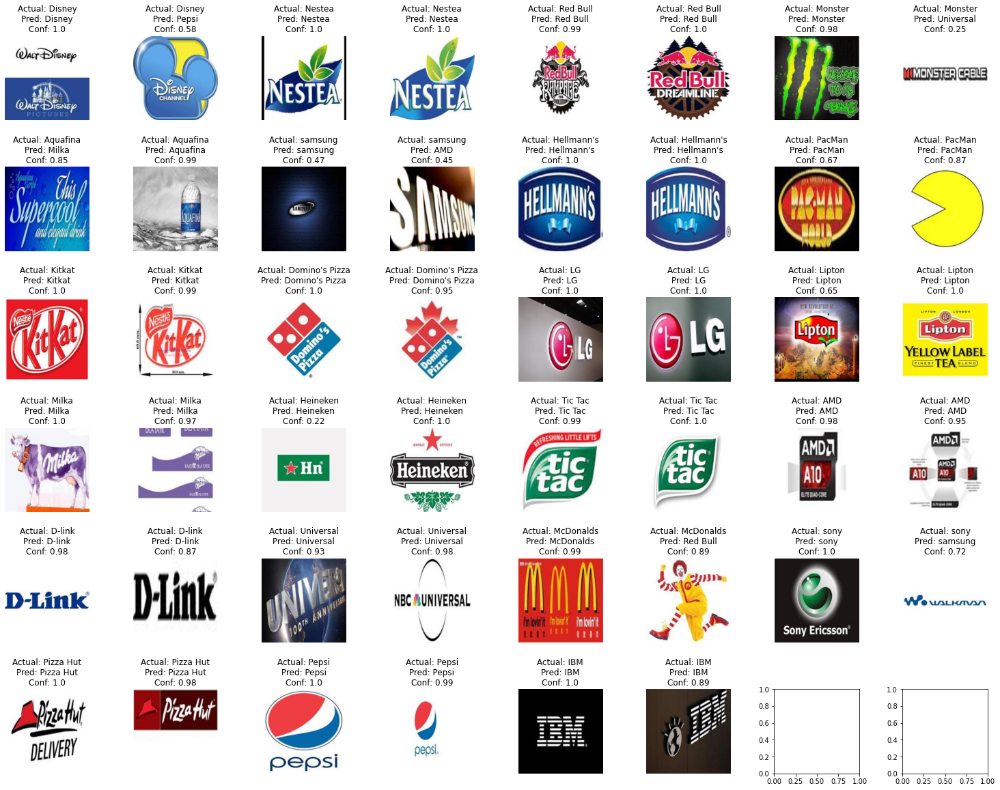

In [ ]:
# Se evalua el modelo MobileNet
path  = "03_evaluation_data/"
true_labels_10 = np.array([])
pred_labels_10 = np.array([])
true_labels_10, pred_labels_10 = evaluate_model(path,modelMN_10,train_generatorMN)

In [ ]:
# Evaluación del modelo MobileNet, incluyendo:
#    Reporte de desempeño
#    Reporte de clasificación del modelo
#    Reporte de matriz de confusión
display_model_performance_metrics(true_labels=true_labels_10, 
                                  predicted_labels=pred_labels_10, 
                                  classes=list(set(true_labels_10)))

Model Performance metrics:
------------------------------
Accuracy: 0.9014
Precision: 0.9049
Recall: 0.9014
F1 Score: 0.9009

Model Classification report:
------------------------------
                precision    recall  f1-score   support

           IBM       1.00      0.93      0.97        15
     Pizza Hut       0.87      0.87      0.87        15
     McDonalds       1.00      0.87      0.93        15
            LG       0.93      0.93      0.93        15
      Red Bull       0.78      0.93      0.85        15
        Kitkat       1.00      1.00      1.00        15
      Aquafina       0.75      0.80      0.77        15
      Heineken       0.94      1.00      0.97        15
    Hellmann's       1.00      1.00      1.00        15
        PacMan       0.86      0.80      0.83        15
        Lipton       0.87      0.87      0.87        15
           AMD       0.88      1.00      0.94        15
        Nestea       0.93      0.87      0.90        15
        D-link       1.00    

Realizando la <font color=green>__EVALUACIÓN__</font> para este modelo <font color=red>__MobileNet M10__</font> con las imágenes dedicadas, se evidencia un __*accuracy*__ del __90,14%__ y un __*F-Score*__ del __90,09%__. Las clase que mejor de predijeron fueron Tic Tac, Kitkat, D-Link y Hellmann's con el __*F-Score*__ de __100%__; IBM, Heineken, Domino's Pizza con __97%__. Mientras que Aquafina tiene __77%__ y Monster el __80%__.

In [ ]:
# Se guarda el modelo
modelMN_10.save('11_MobileNet_M10.h5')